In [1075]:
import warnings                                  # `do not disturb` mode
warnings.filterwarnings('ignore')

from dateutil.relativedelta import relativedelta # working with dates with style
import hvplot as hv
import hvplot.pandas
from itertools import product                    # some useful functions
import matplotlib.pyplot as plt                  # plots
import numpy as np                               # vectors and matrices
import pandas as pd                              # tables and data manipulations
from pathlib import Path
import pickle
from pypalettes import load_cmap, add_cmap
import seaborn as sns                            # more plots
from scipy.optimize import minimize              # for function minimization
import scipy.stats as scs
from sklearn.metrics import mean_absolute_percentage_error as mape
import statsmodels.api as sm
import statsmodels.formula.api                     # statistics and econometrics
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.tools.eval_measures import rmspe, rmse
from statsmodels.tsa.api import (kpss, adfuller, seasonal_decompose, STL)
import statsmodels.tsa.api as smt
from statsmodels.tsa.statespace.sarimax import SARIMAX
import tqdm

# Set plot styles
plt.rcParams["figure.figsize"] = [30, 5]
plt.style.use('default')


# Festlegen der Farben
cmap = load_cmap("Apricot")
colors = ['#D72000FF', '#EE6100FF', '#FFAD0AFF', '#1BB6AFFF', 
          '#9093A2FF', '#132157FF']
cmap_continuous = add_cmap(
    colors=["#FFFFFFFF", "#FFF9A1FF", "#BAD09DFF", "#76D3CFFF", "#459E9EFF", "#306677FF", "#24385FFF", "#132157FF"],
    name="apricot_continuous",
    cmap_type="continuous"
)
cmap8 = add_cmap(
    colors=['#D72000FF', '#EE6100FF', '#FFAD0AFF', '#FFD700FF', '#1BB6AFFF', '#005F73FF', '#9093A2FF', '#132157FF'],
    name="apricot8colors",
    cmap_type="discrete"
)
cmap7 = add_cmap(
    colors=['#D72000FF', '#EE6100FF', '#FFAD0AFF', '#FFD700FF', '#1BB6AFFF', '#9093A2FF', '#132157FF'],
    name="apricot7colors",
    cmap_type="discrete"
)


%matplotlib inline

In [ ]:
df_hourly = pd.read_csv('df_hourly_2020.csv')
df_hourly_test = pd.read_csv('df_hourly_2024.csv')

df_hourly = df_hourly.drop(columns=["Unnamed: 0"])  # Unnötige Spalte löschen
df_hourly["date"] = pd.to_datetime(df_hourly["date"])  # Falls noch nicht im Datetime-Format
df_hourly = df_hourly.set_index("date")  # Datum als Index setzen
df_hourly["weekday"] = df_hourly.index.dayofweek  # Montag=0, Sonntag=6

df_hourly_test = df_hourly_test.drop(columns=["Unnamed: 0"])  # Unnötige Spalte löschen
df_hourly_test["date"] = pd.to_datetime(df_hourly_test["date"])  # Falls noch nicht im Datetime-Format
df_hourly_test = df_hourly_test.set_index("date")  # Datum als Index setzen
df_hourly_test["weekday"] = df_hourly_test.index.dayofweek  # Montag=0, Sonntag=6

In [26]:
# Sicherstellen, dass der Index von df_hourly ein DatetimeIndex ist
df_hourly.index = pd.to_datetime(df_hourly.index)

# Slice des DataFrames ab dem Index Juli 2020
df_hourly_time_modified = df_hourly[df_hourly.index >= '2022-01-01']

# Index sicherstellen
df_hourly_time_modified['calls'] = df_hourly_time_modified['calls'].asfreq('H')

In [1113]:
# Hilfsfunktionen

import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, median_absolute_error

# Funktion zur Berechnung der SMAPE
def smape(y_true, y_pred):
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 2.0
    mask = denominator != 0
    return np.mean(np.abs(y_true[mask] - y_pred[mask]) / denominator[mask]) * 100


# Funktion zum Plotten der Fehlermetriken
def plot_error_metrics(y_true, y_pred, filename="error_metrics.png"):
    # Entferne NaNs
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    mask = ~np.isnan(y_true) & ~np.isnan(y_pred)
    y_true = y_true[mask]
    y_pred = y_pred[mask]

    # Fehlermetriken berechnen
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    mape = np.mean(np.abs((y_true[y_true != 0] - y_pred[y_true != 0]) / y_true[y_true != 0])) * 100
    smape_val = smape(y_true, y_pred)
    med_ae = median_absolute_error(y_true, y_pred)

    metrics = {
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'R²': r2,
        'MAPE (%)': mape,
        'SMAPE (%)': smape_val,
        'Median AE': med_ae
    }

    # Feste Farben in der gewünschten Reihenfolge
    fixed_colors = ['#D72000FF', '#132157FF', '#9093A2FF', '#1BB6AFFF',
                    '#FFAD0AFF', '#EE6100FF', '#D72000FF']

    # Plot
    plt.style.use("default")
    fig, ax = plt.subplots(figsize=(8, 5))
    bars = ax.barh(list(metrics.keys()), list(metrics.values()), color=fixed_colors[:len(metrics)])

    # Werte neben den Balken anzeigen
    for bar in bars:
        width = bar.get_width()
        ax.text(width + 0.5, bar.get_y() + bar.get_height() / 2,
                f'{width:.4f}', va='center', fontsize=9)

    ax.set_xlim([0, 60])
    ax.set_title("Fehlermetriken", fontsize=14, weight="bold")
    ax.set_xlabel("Wert", fontsize=12)
    ax.grid(True, axis='x', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()
    plt.savefig(filename, dpi=300)
    plt.close()
    print(f"Fehlermetriken gespeichert als '{filename}'.")

# Funktion zum Plotten der Vorhersagefehler
def plot_forecast_vs_actual(forecast, test_data, start_date, end_date, color='#9093A2FF', filename=None):
    """
    Plottet den Vergleich zwischen Vorhersage (forecast) und echten Testdaten (test_data)
    für einen gegebenen Zeitraum.
    """
    # Filter für gewünschten Zeitraum
    forecast_subset = forecast[(forecast.index >= start_date) & (forecast.index <= end_date)]
    test_subset = test_data[(test_data.index >= start_date) & (test_data.index <= end_date)]

    # Plot
    plt.style.use('default')
    plt.figure(figsize=(15, 3)
    )

    plt.plot(test_subset.index, test_subset['calls'], label='Echte Werte (Testdaten)', color='#FFAD0AFF', linewidth=1.1)
    plt.plot(forecast_subset.index, forecast_subset, label='Vorhersage (yhat)', color=color, linewidth=1.1)

    plt.title('Vorhersage vs. Testdaten (Ausschnitt zur Prüfung der stündlichen Struktur)', fontsize=14)
    plt.xlabel('Datum', fontsize=12)
    plt.ylabel('Anzahl der Anrufe (y)', fontsize=12)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()

    if filename:
        plt.show()
        plt.savefig(filename, dpi=300)
        print(f"Plot gespeichert als '{filename}'")
        plt.close()
    else:
        plt.show()

# SARIMA - Modellberechnung

In [4]:
# SARIMA Modell für df_hourly
sarima_model_hourly = SARIMAX(df_hourly_time_modified['calls'], 
                order=(1, 1, 1), 
                seasonal_order=(2, 1, 2, 24),
                exog=df_hourly_time_modified[['days_to_holiday', 'weekday']]).fit(disp=False)



c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)


                                        SARIMAX Results                                        
Dep. Variable:                                   calls   No. Observations:                17520
Model:             SARIMAX(1, 1, 1)x(2, 1, [1, 2], 24)   Log Likelihood              -51740.100
Date:                                 Sat, 05 Apr 2025   AIC                         103498.201
Time:                                         09:40:28   BIC                         103568.128
Sample:                                     01-01-2022   HQIC                        103521.228
                                          - 12-31-2023                                         
Covariance Type:                                   opg                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
days_to_holiday    -0.0033      0.004     -0.787      0.431     

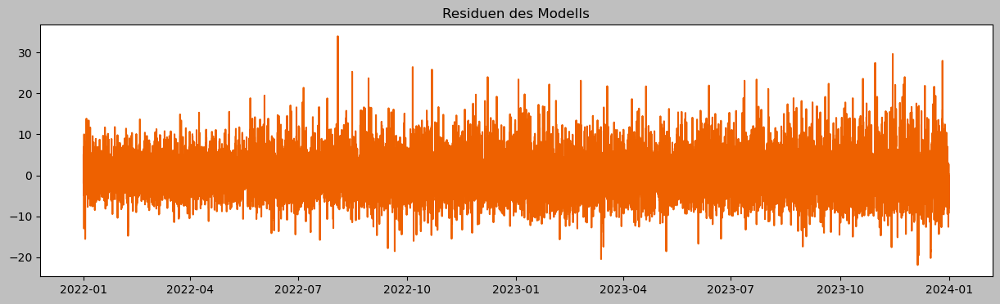

<Figure size 1000x400 with 0 Axes>

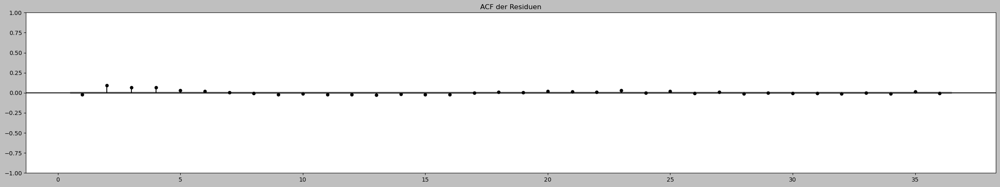

In [5]:
print(sarima_model_hourly.summary())
# Plot der Residuen
# Die Residuen sollten keine offensichtliche Struktur mehr haben (zufällig um 0 verteilt).
# Die ACF der Residuen sollte für alle Lags innerhalb des Konfidenzintervalls (grauer Bereich) liegen.
# Residuen des SARIMA-Modells
residuals = sarima_model_hourly.resid

# Erster Plot: Residuen-Zeitreihe
plt.figure(figsize=(15, 4))
plt.plot(residuals, color=cmap.colors[1])
plt.title("Residuen des Modells")
plt.show()

# Zweiter Plot: Autokorrelationsfunktion der Residuen
plt.figure(figsize=(10, 4))
plot_acf(residuals, zero=False, lags=36)
plt.title("ACF der Residuen")
plt.show()

## HPO mit Optuna für SARIMA

In [39]:
import optuna
from statsmodels.tsa.statespace.sarimax import SARIMAX


def objective(trial, data, s):
    # Hyperparameter-Räume definieren
    p = trial.suggest_int("p", 0, 3)
    d = trial.suggest_int("d", 0, 1)  # Stationarity: meist nur 0 oder 1 sinnvoll
    q = trial.suggest_int("q", 0, 3)
    P = trial.suggest_int("P", 0, 2)
    D = trial.suggest_int("D", 0, 1)  # Saisonale Differenzierung: meist 0 oder 1 sinnvoll
    Q = trial.suggest_int("Q", 0, 2)

    try:
        # SARIMA-Modell trainieren
        model = SARIMAX(data, order=(p, d, q),
                        seasonal_order=(P, D, Q, s)).fit(disp=False)
        # Optimierung basierend auf dem Akaike-Informationskriterium (AIC)
        return model.aic
    except Exception as e:
        # Rückgabe von "unendlich", falls das Modell fehlschlägt
        return float("inf")

def optimize_sarima(data, s, n_trials=50):
    print(f"Starte Optimierung für s={s} mit {n_trials} Trials...")
    study = optuna.create_study(direction="minimize")
    study.optimize(lambda trial: objective(trial, data, s), n_trials=n_trials)
    print("Beste Parameter:", study.best_params)
    return study.best_params, study # Rückgabe des Studienobjekts für Plot



In [40]:
best_params_hourly_mod, study = optimize_sarima(df_hourly_time_modified['calls'], s=24, n_trials=50)
print("Optimale Parameter für hourly_diff_24:", best_params_hourly_mod)

[I 2025-04-12 11:01:57,683] A new study created in memory with name: no-name-d9119635-8f12-4354-9152-17aa0abf7469


Starte Optimierung für s=24 mit 50 Trials...


[I 2025-04-12 11:32:17,192] Trial 0 finished with value: 104582.44339557903 and parameters: {'p': 3, 'd': 1, 'q': 3, 'P': 2, 'D': 0, 'Q': 1}. Best is trial 0 with value: 104582.44339557903.
[I 2025-04-12 11:35:45,601] Trial 1 finished with value: 103993.0096603255 and parameters: {'p': 0, 'd': 0, 'q': 3, 'P': 2, 'D': 1, 'Q': 1}. Best is trial 1 with value: 103993.0096603255.
[I 2025-04-12 11:38:29,462] Trial 2 finished with value: 104295.00664833438 and parameters: {'p': 1, 'd': 0, 'q': 0, 'P': 2, 'D': 1, 'Q': 1}. Best is trial 1 with value: 103993.0096603255.
[I 2025-04-12 11:45:22,097] Trial 3 finished with value: 104013.80828773619 and parameters: {'p': 3, 'd': 1, 'q': 2, 'P': 1, 'D': 0, 'Q': 2}. Best is trial 1 with value: 103993.0096603255.
[I 2025-04-12 11:47:37,283] Trial 4 finished with value: 111935.46363527434 and parameters: {'p': 0, 'd': 1, 'q': 0, 'P': 1, 'D': 1, 'Q': 2}. Best is trial 1 with value: 103993.0096603255.
[I 2025-04-12 11:51:23,607] Trial 5 finished with value

Beste Parameter: {'p': 1, 'd': 0, 'q': 1, 'P': 1, 'D': 1, 'Q': 2}
Optimale Parameter für hourly_diff_24: {'p': 1, 'd': 0, 'q': 1, 'P': 1, 'D': 1, 'Q': 2}


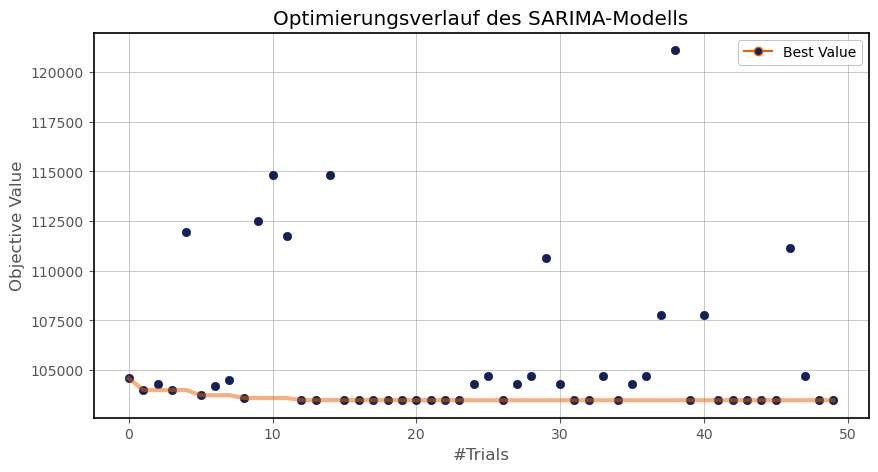

In [94]:
import matplotlib.pyplot as plt
from optuna.visualization.matplotlib import plot_optimization_history
from matplotlib.lines import Line2D

# Plot erstellen
ax = plot_optimization_history(study)
fig = ax.figure
fig.set_size_inches(10, 5)

# Farben anpassen
for line in ax.get_lines():
    line.set_color('#EE6100FF') # Linienfarbe
    line.set_linewidth(3)

# Punktfarbe ändern (scatter plot)
for collection in ax.collections:
    collection.set_facecolor( '#132157FF')   # Punktfarbe
    collection.set_edgecolor( '#132157FF')   # Randfarbe

# Hintergrundfarbe
ax.set_facecolor("#ffffff")
# Gitterlinien anpassen
ax.grid(color='#9093A2FF', linestyle="-", linewidth=0.5, alpha=0.7)
fig.patch.set_facecolor("#ffffff")
# Spines (Rahmen) explizit sichtbar machen – falls Style sie unterdrückt
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.2)
    spine.set_color("black")  # Optional: Rahmenfarbe

# Achsentitel
ax.set_xlabel("#Trials")
ax.set_ylabel("Objective Value")
ax.set_title("Optimierungsverlauf des SARIMA-Modells")

# Alte Legende entfernen
legend = ax.get_legend()
if legend:
    legend.remove()

# Neue Legende manuell hinzufügen
custom_legend = [
    Line2D([0], [0], marker="o", color='#EE6100FF', label="Best Value", 
           markerfacecolor= '#132157FF', linestyle="-")
]
ax.legend(handles=custom_legend, loc="best", facecolor="#ffffff", edgecolor='#9093A2FF')

# Speichern oder anzeigen
fig.savefig("grafik.png", dpi=300, bbox_inches="tight")
plt.show()


In [ ]:
#Test wie die Optimierung mit vorher logarithmierten Werten aussieht
df_hourly_time_modified['calls_log'] = np.log1p(df_hourly_time_modified['calls'])

best_params_hourly_mod, study = optimize_sarima(df_hourly_time_modified['calls_log'], s=24, n_trials=50)
print("Optimale Parameter für hourly_diff_24:", best_params_hourly_mod)

[I 2025-04-09 23:03:12,034] A new study created in memory with name: no-name-904e01d0-1e94-4de6-bed5-2e5eec6a316b


Starte Optimierung für s=24 mit 50 Trials...


c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
[I 2025-04-09 23:07:23,090] Trial 0 finished with value: 20338.28473350993 and parameters: {'p': 3, 'd': 0, 'q': 0, 'P': 0, 'D': 1, 'Q': 2}. Best is trial 0 with value: 20338.28473350993.
c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.


Beste Parameter: {'p': 3, 'd': 0, 'q': 2, 'P': 1, 'D': 1, 'Q': 1}
Optimale Parameter für hourly_diff_24: {'p': 3, 'd': 0, 'q': 2, 'P': 1, 'D': 1, 'Q': 1}


c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)


                                        SARIMAX Results                                        
Dep. Variable:                                   calls   No. Observations:                17520
Model:             SARIMAX(1, 0, 1)x(2, 1, [1, 2], 24)   Log Likelihood              -51595.778
Date:                                 Tue, 08 Apr 2025   AIC                         103209.555
Time:                                         10:11:30   BIC                         103279.483
Sample:                                     01-01-2022   HQIC                        103232.582
                                          - 12-31-2023                                         
Covariance Type:                                   opg                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
days_to_holiday    -0.0062      0.003     -2.378      0.017     

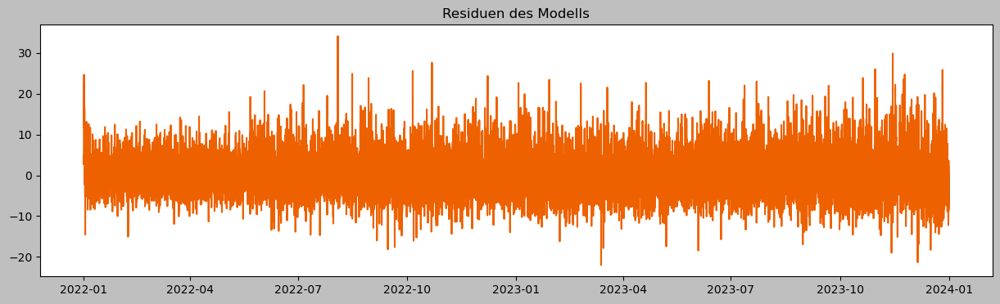

<Figure size 1000x400 with 0 Axes>

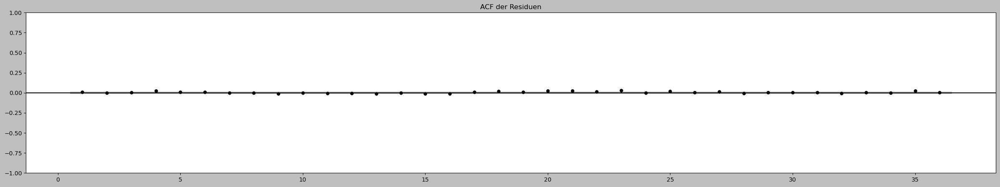

In [25]:

# SARIMA Modell für df_hourly
sarima_model_hourly = SARIMAX(df_hourly_time_modified['calls'], 
                order=(1, 0, 1), 
                seasonal_order=(2, 1, 2, 24),
                exog=df_hourly_time_modified[['days_to_holiday', 'weekday']]).fit(disp=False)

print(sarima_model_hourly.summary())
# Plot der Residuen
# Die Residuen sollten keine offensichtliche Struktur mehr haben (zufällig um 0 verteilt).
# Die ACF der Residuen sollte für alle Lags innerhalb des Konfidenzintervalls (grauer Bereich) liegen.
# Residuen des SARIMA-Modells
residuals = sarima_model_hourly.resid

# Erster Plot: Residuen-Zeitreihe
plt.figure(figsize=(15, 4))
plt.plot(residuals, color=cmap.colors[1])
plt.title("Residuen des Modells")
plt.show()

# Zweiter Plot: Autokorrelationsfunktion der Residuen
plt.figure(figsize=(10, 4))
plot_acf(residuals, zero=False, lags=36)
plt.title("ACF der Residuen")
plt.show()

c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)


                                     SARIMAX Results                                      
Dep. Variable:                              calls   No. Observations:                17520
Model:             SARIMAX(1, 0, 1)x(1, 1, 1, 24)   Log Likelihood              -51596.188
Date:                            Tue, 08 Apr 2025   AIC                         103206.376
Time:                                    11:32:37   BIC                         103260.764
Sample:                                01-01-2022   HQIC                        103224.286
                                     - 12-31-2023                                         
Covariance Type:                              opg                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
days_to_holiday    -0.0062      0.003     -2.363      0.018      -0.011      -0.001
weekday            -

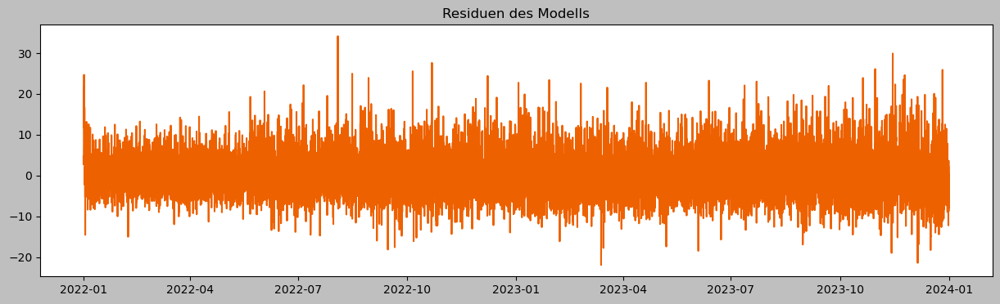

<Figure size 1000x400 with 0 Axes>

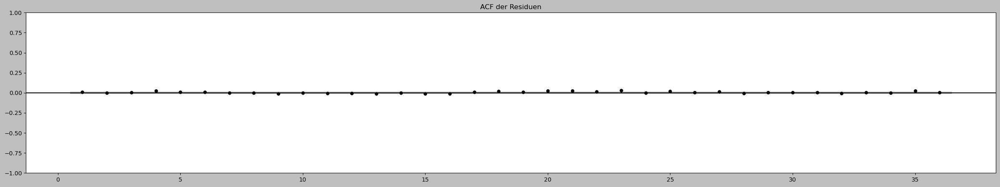

In [ ]:

# SARIMA Modell für df_hourly
sarima_model_hourly = SARIMAX(df_hourly_time_modified['calls'], 
                order=(1, 0, 1), 
                seasonal_order=(1, 1, 1, 24),
                exog=df_hourly_time_modified[['days_to_holiday', 'weekday']]).fit(disp=False)

print(sarima_model_hourly.summary())

In [66]:
# Schlechter Wert in Heteroskedastizität -> p-Wert = 0.0000 -> klein
# es gibt keine konstante Varianz, beeinträchtigt die Güte der Schätzung
# ggf. hilft log-transformieren der Daten
# oder Box-Cox-Transformation

# Log-Transformation der Daten
df_hourly_time_modified['calls_log'] = np.log(df_hourly_time_modified['calls']+1)

                                     SARIMAX Results                                      
Dep. Variable:                          calls_log   No. Observations:                17520
Model:             SARIMAX(1, 0, 1)x(1, 1, 1, 24)   Log Likelihood              -10058.448
Date:                            Sat, 12 Apr 2025   AIC                          20130.896
Time:                                    22:11:22   BIC                          20185.284
Sample:                                01-01-2022   HQIC                         20148.806
                                     - 12-31-2023                                         
Covariance Type:                              opg                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
days_to_holiday    -0.0003      0.000     -1.493      0.135      -0.001       0.000
weekday            -

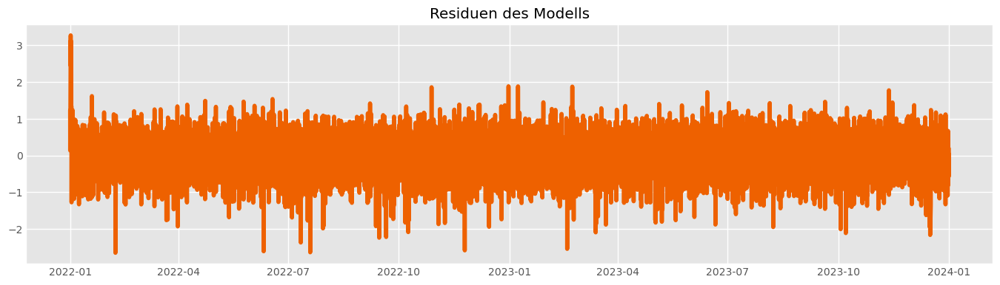

<Figure size 1000x400 with 0 Axes>

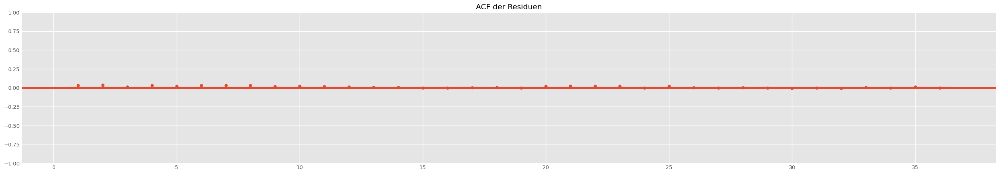

In [ ]:
# SARIMA Modell für df_hourly
sarima_model_hourly_log = SARIMAX(df_hourly_time_modified['calls_log'], 
                order=(1, 0, 1), 
                seasonal_order=(1, 1, 1, 24),
                exog=df_hourly_time_modified[['days_to_holiday', 'weekday']]).fit(disp=False)

print(sarima_model_hourly_log.summary())


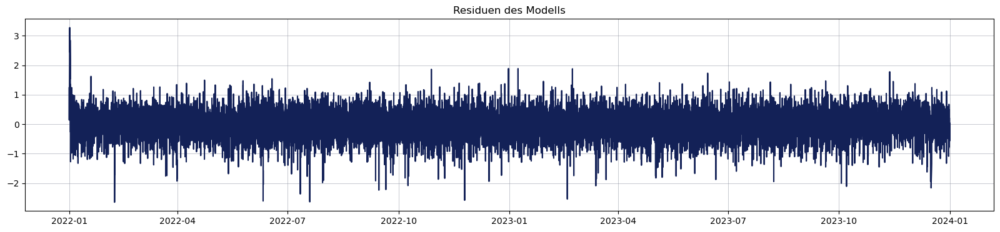

<Figure size 2000x400 with 0 Axes>

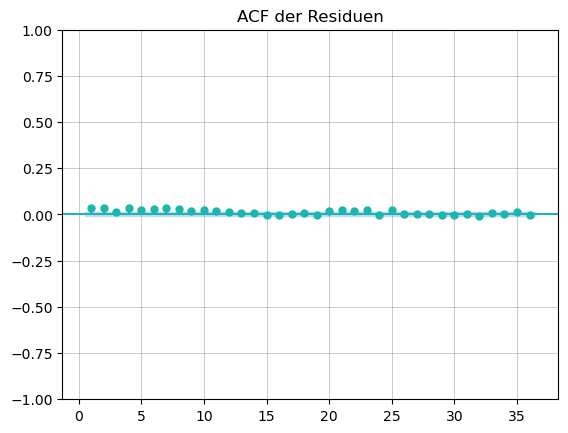

In [ ]:
# Plot der Residuen
# Die Residuen sollten keine offensichtliche Struktur mehr haben (zufällig um 0 verteilt).
# Die ACF der Residuen sollte für alle Lags innerhalb des Konfidenzintervalls (grauer Bereich) liegen.
# Residuen des SARIMA-Modells
residuals = sarima_model_hourly_log.resid

# Erster Plot: Residuen-Zeitreihe
plt.figure(figsize=(20, 4))
plt.plot(residuals, color=cmap.colors[5])
plt.title("Residuen des Modells")
# Gitterlinien anpassen
plt.grid(color='#9093A2FF', linestyle="-", linewidth=0.5, alpha=0.7)
fig.patch.set_facecolor("#ffffff")

plt.show()

# Zweiter Plot: Autokorrelationsfunktion der Residuen
plt.figure(figsize=(20, 4))
plot_acf(residuals, zero=False, lags=36, color=cmap.colors[3])
plt.title("ACF der Residuen")
# Gitterlinien anpassen
plt.grid(color='#9093A2FF', linestyle="-", linewidth=0.5, alpha=0.7)
fig.patch.set_facecolor("#ffffff")
plt.show()

In [58]:
# SARIMA Modell für df_hourly
sarima_model_hourly_log2 = SARIMAX(df_hourly_time_modified['calls_log'], 
                order=(3, 0, 2), 
                seasonal_order=(1, 1, 1, 24),
                exog=df_hourly_time_modified[['days_to_holiday', 'weekday']]).fit(disp=False)

print(sarima_model_hourly_log2.summary())
# Plot der Residuen
# Die Residuen sollten keine offensichtliche Struktur mehr haben (zufällig um 0 verteilt).
# Die ACF der Residuen sollte für alle Lags innerhalb des Konfidenzintervalls (grauer Bereich) liegen.
# Residuen des SARIMA-Modells
residuals = sarima_model_hourly_log2.resid

# Erster Plot: Residuen-Zeitreihe
plt.figure(figsize=(15, 4))
plt.plot(residuals, color=cmap.colors[1])
plt.title("Residuen des Modells")
plt.show()

# Zweiter Plot: Autokorrelationsfunktion der Residuen
plt.figure(figsize=(10, 4))
plot_acf(residuals, zero=False, lags=36)
plt.title("ACF der Residuen")
plt.show()

KeyError: 'calls_log'

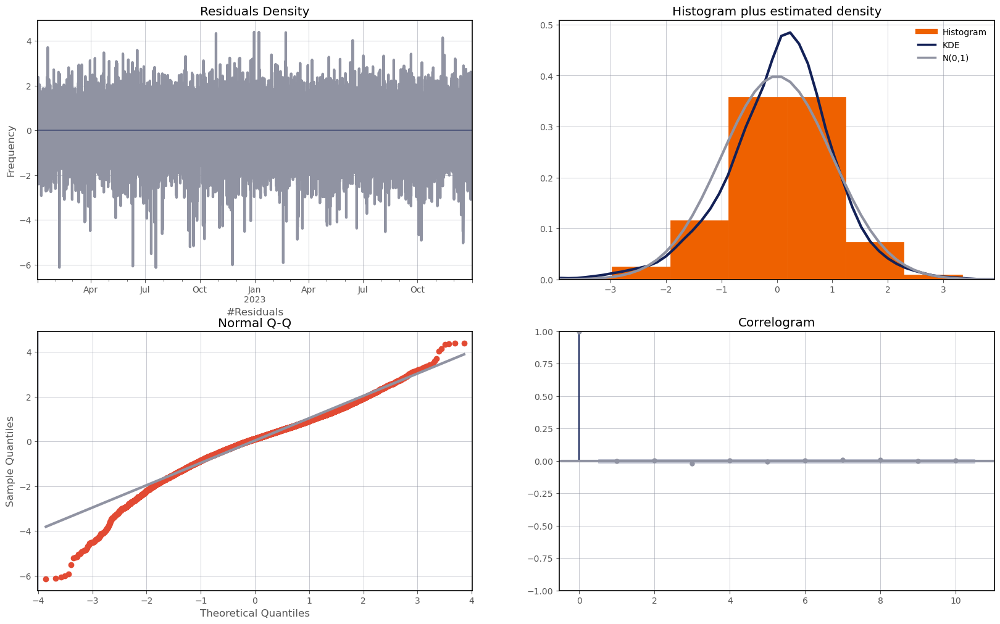

In [120]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# Diagnostik-Plot von SARIMA erstellen
fig = sarima_model_hourly_log.plot_diagnostics(figsize=(20, 12))
axes = fig.get_axes()

# # Farben anpassen für alle Linien im Plot
for ax in axes:
    for line in ax.get_lines():
        line.set_color('#9093A2FF')  # Linienfarbe
        line.set_linewidth(3)  # Linienbreite

    # Punktfarbe ändern für alle scatter-Plots (in manchen Achsen wie z.B. Residuen)
    for collection in ax.collections:
        collection.set_facecolor('#132157FF')  # Punktfarbe
        collection.set_edgecolor('#132157FF')  # Randfarbe

    # Gitterlinien anpassen
    ax.grid(color='#9093A2FF', linestyle="-", linewidth=0.5, alpha=0.7)

    # Hintergrundfarbe der Achse
    ax.set_facecolor('#ffffff')

    # Spines (Rahmen) explizit sichtbar machen und anpassen
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1.2)
        spine.set_color("black")  # Optional: Rahmenfarbe

# Setze Achsentitel
axes[0].set_xlabel("#Residuals")
axes[0].set_ylabel("Frequency")
axes[0].set_title("Residuals Density")

# QQ-Plot ist axes[1]
qq_ax = axes[1]

# Definiere die Ziel-Farben
hist_color = '#EE6100FF'
kde_color = '#132157FF'
norm_color = '#9093A2FF'

# Setze Farben der Linien (KDE und N(0,1))
lines = qq_ax.get_lines()
if len(lines) >= 2:
    lines[0].set_color(kde_color)   # KDE
    lines[1].set_color(norm_color)  # N(0,1)

# Setze Farbe für das Histogramm (Bars)
for container in qq_ax.containers:
    for bar in container:
        bar.set_facecolor(hist_color)
        bar.set_edgecolor(hist_color)

# Entferne alte Legende, falls vorhanden
if qq_ax.get_legend():
    qq_ax.get_legend().remove()

# Neue Legende hinzufügen mit korrekten Farben
custom_legend = [
    Line2D([0], [0], color=hist_color, lw=6, label="Histogram"),
    Line2D([0], [0], color=kde_color, lw=2.5, label="KDE"),
    Line2D([0], [0], color=norm_color, lw=2.5, label="N(0,1)")
]
qq_ax.legend(handles=custom_legend, loc="upper right", frameon=False)

# Plot anzeigen
plt.show()


In [43]:
summary_text = sarima_model_hourly_log.summary().as_text()

# Bild erstellen
plt.figure(figsize=(12, 8))
plt.axis("off")
plt.text(0, 1, summary_text, fontsize=10, family="monospace", verticalalignment="top")
plt.savefig("sarima_summary.png", bbox_inches="tight", dpi=300)
plt.close()

C:\Users\ChiaraVogt\AppData\Local\Temp\ipykernel_9164\1868589171.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_hourly_time_modified['calls_boxcox'], fitted_lambda = boxcox(df_hourly_time_modified['calls'] + 1)
c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)


                                     SARIMAX Results                                      
Dep. Variable:                       calls_boxcox   No. Observations:                17520
Model:             SARIMAX(1, 0, 1)x(1, 1, 1, 24)   Log Likelihood              -27494.996
Date:                            Tue, 08 Apr 2025   AIC                          55003.993
Time:                                    18:05:12   BIC                          55058.381
Sample:                                01-01-2022   HQIC                         55021.903
                                     - 12-31-2023                                         
Covariance Type:                              opg                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
days_to_holiday    -0.0013      0.001     -2.087      0.037      -0.003   -8.17e-05
weekday            -

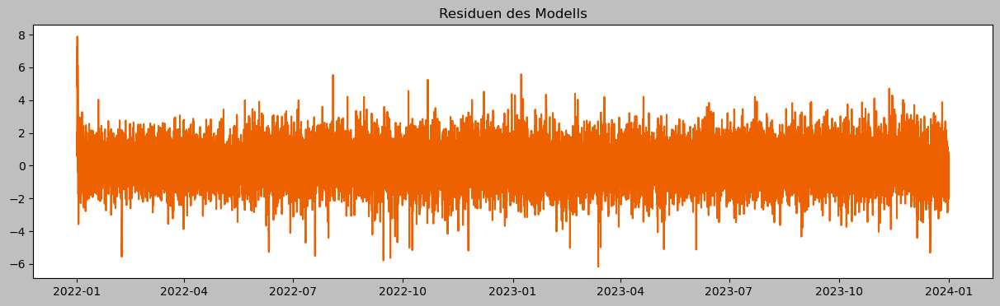

<Figure size 1000x400 with 0 Axes>

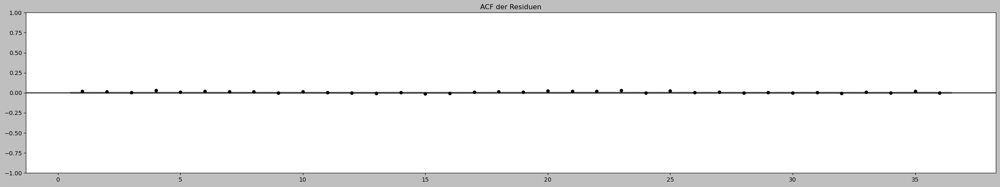

In [ ]:
# Box-Cox-Transformation der Daten
from scipy.stats import boxcox
df_hourly_time_modified['calls_boxcox'], fitted_lambda = boxcox(df_hourly_time_modified['calls'] + 1)
# SARIMA Modell für df_hourly
sarima_model_hourly = SARIMAX(df_hourly_time_modified['calls_boxcox'], 
                order=(1, 0, 1), 
                seasonal_order=(1, 1, 1, 24),
                exog=df_hourly_time_modified[['days_to_holiday', 'weekday']]).fit(disp=False)

print(sarima_model_hourly.summary())

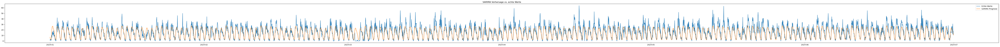

In [1015]:
# Vorhersage der 'calls' für das erste Halbjahr 2024
# Vorhersagezeitraum definieren
start = df_hourly_test.index[0]
end = df_hourly_test.index[-1]
exog_test = df_hourly_test[['days_to_holiday', 'weekday']]

# Vorhersage mit dem SARIMA-Modell
sarimax_forecast_hourly_log = sarima_model_hourly_log.predict(start=start, end=end, exog=exog_test)
# Vorhersage zurücktransformieren
sarimax_y_pred = np.exp(sarimax_forecast_hourly_log)

# Vergleich der Vorhersage mit den echten Werten
plt.figure(figsize=(100, 4))
plt.plot(df_hourly_test.index, df_hourly_test['calls'], label='Echte Werte')
plt.plot(df_hourly_test.index, sarimax_forecast, label='SARIMA Prognose')
plt.legend()
plt.title("SARIMA Vorhersage vs. echte Werte")
plt.show()

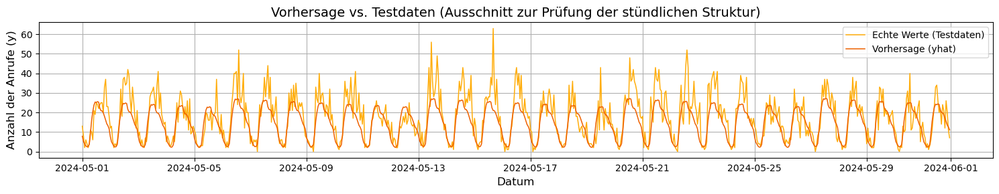

Plot gespeichert als 'sarimax_forecast_vs_test.png'


In [1096]:
plot_forecast_vs_actual(
    forecast=sarimax_y_pred,
    test_data=df_hourly_test,
    start_date="2024-05-01",
    end_date="2024-05-31 23:00:00",
    color=colors[1],
    filename="sarimax_forecast_vs_test.png"
)

In [40]:
# Fehlermetriken berechnen
from sklearn.metrics import mean_absolute_error, root_mean_squared_error

mae = mean_absolute_error(df_hourly_test['calls'], forecast)
rmse = root_mean_squared_error(df_hourly_test['calls'], forecast)
print(f"MAE: {mae:.2f}, RMSE: {rmse:.2f}")

MAE: 4.80, RMSE: 6.78


In [18]:
# Fehlermetriken berechnen
from sklearn.metrics import mean_absolute_error, root_mean_squared_error

mae = mean_absolute_error(df_hourly_test['calls'], forecast_log2)
rmse = root_mean_squared_error(df_hourly_test['calls'], forecast_log2)
print(f"MAE: {mae:.2f}, RMSE: {rmse:.2f}")

MAE: 4.80, RMSE: 6.78


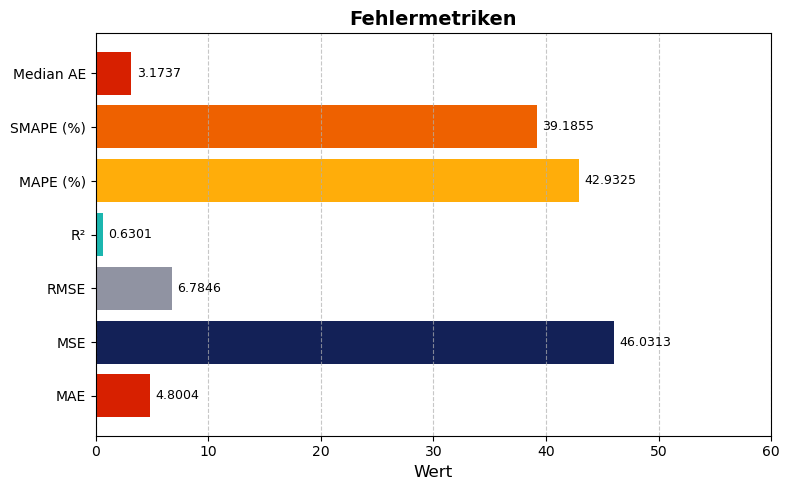

Fehlermetriken gespeichert als 'sarima_fehler.png'.


In [898]:
plot_error_metrics(df_hourly_test['calls'], sarimax_y_pred, filename="sarima_fehler.png")

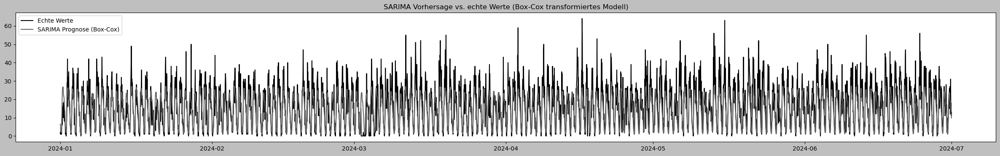

In [41]:
from scipy.special import inv_boxcox
import matplotlib.pyplot as plt

# Exogene Variablen aus dem Testdatensatz extrahieren
exog_test = df_hourly_test[['days_to_holiday', 'weekday']]

# Start- und Endzeitpunkt der Vorhersage
start = df_hourly_test.index[0]
end = df_hourly_test.index[-1]

# Vorhersage mit dem SARIMA-Modell (Box-Cox)
sarima_forecast_boxcox = sarima_model_hourly.predict(start=start, end=end, exog=exog_test)

# Rücktransformation: Box-Cox → Originalskala (nicht vergessen: +1 beim Forward war nötig)
forecast = inv_boxcox(sarima_forecast_boxcox, fitted_lambda) - 1

# Plot der Vorhersage
plt.figure(figsize=(30, 4))
plt.plot(df_hourly_test.index, df_hourly_test['calls'], label='Echte Werte')
plt.plot(df_hourly_test.index, forecast, label='SARIMA Prognose (Box-Cox)')
plt.legend()
plt.title("SARIMA Vorhersage vs. echte Werte (Box-Cox transformiertes Modell)")
plt.show()


In [42]:
# Fehlermetriken berechnen
from sklearn.metrics import mean_absolute_error, root_mean_squared_error

mae = mean_absolute_error(df_hourly_test['calls'], forecast)
rmse = root_mean_squared_error(df_hourly_test['calls'], forecast)
print(f"MAE: {mae:.2f}, RMSE: {rmse:.2f}")

MAE: 4.83, RMSE: 6.83


# ETS Modelltraining

In [7]:
calls_clean = df_hourly_time_modified['calls'].dropna()

print(calls_clean.describe())

count    17520.000000
mean        12.030308
std          8.765638
min          0.000000
25%          4.000000
50%         12.000000
75%         18.000000
max         59.000000
Name: calls, dtype: float64


In [10]:
from statsmodels.tsa.exponential_smoothing.ets import ETSModel
import numpy as np

def objective_hourly(trial):
    try:
        error = trial.suggest_categorical("error", ["add", "mul"])
        trend = trial.suggest_categorical("trend", ["add", "mul", None])
        seasonal = trial.suggest_categorical("seasonal", ["add", "mul", None])
        seasonal_periods = trial.suggest_categorical("seasonal_periods", [24, 48, 168])

        # Start mit den Originaldaten, entferne NaNs
        calls_clean = df_hourly_time_modified['calls'].dropna()

        # Wenn einer der Parameter auf "mul" gesetzt ist, Nullwerte durch einen kleinen Wert ersetzen
        if "mul" in [error, trend, seasonal]:
            calls_clean = calls_clean.replace(0, 1e-6)

        # Sicherstellen, dass nach dem Ersetzen noch genug Daten vorhanden sind
        if len(calls_clean) < seasonal_periods * 2:
            raise ValueError("Nicht genug Datenpunkte nach Ersetzen der Nullwerte")

        # Modell erstellen und anpassen
        model = ETSModel(calls_clean, error=error, trend=trend, seasonal=seasonal, seasonal_periods=seasonal_periods)
        fitted_model = model.fit()

        # Vorhersagen machen und sicherstellen, dass sie keine Nullwerte enthalten
        yhat = fitted_model.fittedvalues
        yhat = np.where(yhat == 0, 1e-6, yhat)  # Ersetze Nullvorhersagen durch einen kleinen Wert

        return fitted_model.aic

    except Exception as e:
        print(f"Fehler bei Trial {trial.number}: {e}")
        return float('inf')

study_hourly_ets = optuna.create_study(direction="minimize")
study_hourly_ets.optimize(objective_hourly, n_trials=50)

print(f"Beste Parameter für df_hourly: {study_hourly_ets.best_params}")
print(f"Bestes AIC für df_hourly: {study_hourly_ets.best_value}")


[I 2025-04-10 05:57:42,341] A new study created in memory with name: no-name-346a1e45-bf19-406e-ad28-7b682c31f09e
c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
[I 2025-04-10 05:57:55,319] Trial 0 finished with value: 105235.32095746162 and parameters: {'error': 'add', 'trend': 'add', 'seasonal': 'mul', 'seasonal_periods': 24}. Best is trial 0 with value: 105235.32095746162.
c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
[I 2025-04-10 05

Beste Parameter für df_hourly: {'error': 'mul', 'trend': None, 'seasonal': 'mul', 'seasonal_periods': 24}
Bestes AIC für df_hourly: 102355.76540710437


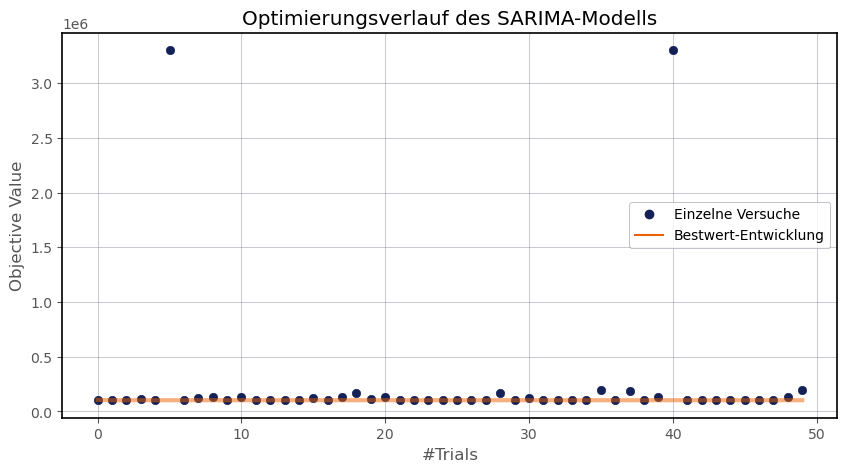

In [113]:
from optuna.visualization.matplotlib import plot_optimization_history
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# Plot erstellen
ax = plot_optimization_history(study_hourly_ets)  # Axes-Objekt
fig = ax.figure                                    # Zugehörige Figure
fig.set_size_inches(10, 5)

# Farben anpassen
for line in ax.get_lines():
    line.set_color('#EE6100FF')  # Linienfarbe
    line.set_linewidth(3)

# Punktfarbe ändern (scatter plot)
for collection in ax.collections:
    collection.set_facecolor('#132157FF')    # Punktfarbe
    collection.set_edgecolor('#132157FF')    # Randfarbe

# Hintergrundfarbe
ax.set_facecolor("#ffffff")
fig.patch.set_facecolor("#ffffff")

# Gitterlinien
ax.grid(color='#9093A2FF', linestyle="-", linewidth=0.5, alpha=0.7)

# Spines (Rahmen)
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.2)
    spine.set_color("black")

# Achsentitel und Titel
ax.set_xlabel("#Trials")
ax.set_ylabel("Objective Value")
ax.set_title("Optimierungsverlauf des SARIMA-Modells")

# Alte Legende entfernen
legend = ax.get_legend()
if legend:
    legend.remove()

# Neue Legende
custom_legend = [
    Line2D([0], [0], marker="o", linestyle="None", color='#132157FF', 
           markerfacecolor='#132157FF', markeredgecolor='#132157FF', label="Einzelne Versuche"),
    Line2D([0], [0], linestyle="-", color='#EE6100FF', label="Bestwert-Entwicklung")
]
ax.legend(handles=custom_legend, loc="best", facecolor="#ffffff", edgecolor='#9093A2FF')

# Anzeige oder Speichern
# fig.savefig("grafik.png", dpi=300, bbox_inches="tight")
plt.show()


In [13]:
# Beste Parameter extrahieren
best_params = study_hourly_ets.best_params

# Cleaned Daten laden (z. B. ohne NaNs)
calls_clean = df_hourly_time_modified['calls'].dropna()
calls_pos = calls_clean.copy()
calls_pos[calls_pos <= 0] = 1e-3  # sehr kleiner positiver Wert

# Bestes Modell nachtrainieren
ets_model = ETSModel(
    calls_pos,
    error=best_params['error'],
    trend=best_params['trend'],
    seasonal=best_params['seasonal'],
    seasonal_periods=best_params['seasonal_periods']
).fit()

# Zusammenfassung anzeigen
print(ets_model.summary())

C:\Users\ChiaraVogt\AppData\Local\Temp\ipykernel_4276\890028692.py:7: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.001' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  calls_pos[calls_pos <= 0] = 1e-3  # sehr kleiner positiver Wert
c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                                 ETS Results                                  
Dep. Variable:                  calls   No. Observations:                17520
Model:                       ETS(MNM)   Log Likelihood              -51161.476
Date:                Thu, 10 Apr 2025   AIC                         102378.951
Time:                        08:10:50   BIC                         102596.542
Sample:                    01-01-2022   HQIC                        102450.599
                         - 12-31-2023   Scale                            0.258
Covariance Type:               approx                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
smoothing_level         0.0174        nan        nan        nan         nan         nan
smoothing_seasonal   9.826e-05   6.16e-05      1.596      0.110   -2.24e-05       0.000
initial_level   

In [33]:

ets_model_add = ETSModel(
    calls_clean,
    error='add',
    trend='add',
    seasonal='add',
    seasonal_periods=168
).fit()

In [34]:
print(ets_model_add.summary())

                                 ETS Results                                  
Dep. Variable:                  calls   No. Observations:                17520
Model:                       ETS(AAA)   Log Likelihood              -51663.938
Date:                Sat, 12 Apr 2025   AIC                         103675.876
Time:                        10:26:33   BIC                         105028.047
Sample:                    01-01-2022   HQIC                        104121.117
                         - 12-31-2023   Scale                           21.324
Covariance Type:               approx                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
smoothing_level          0.0303      0.004      8.183      0.000       0.023       0.038
smoothing_trend       3.034e-06        nan        nan        nan         nan         nan
smoothing_se

In [44]:
summary_text = ets_model_add.summary().as_text()

# Bild erzeugen mit weißem Hintergrund
plt.figure(figsize=(12, 8), facecolor='white')  # Hintergrund der Figur
plt.axis("off")
plt.text(0, 1, summary_text, fontsize=10, family="monospace", verticalalignment="top")
plt.savefig("ets_summary.png", bbox_inches="tight", dpi=300, facecolor='white')  # Hintergrund beim Speichern
plt.close()


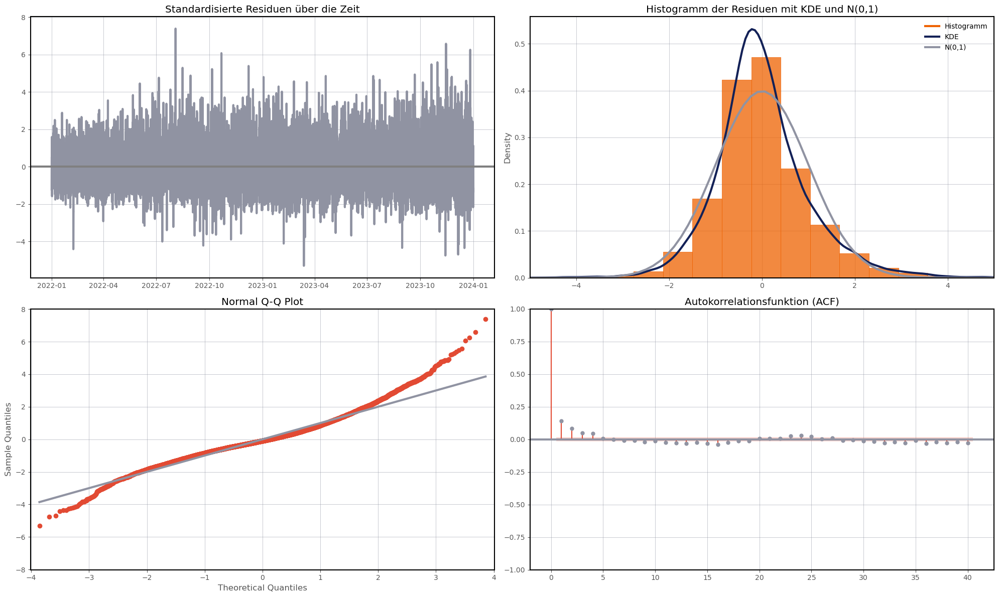

In [155]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf
from scipy import stats

# Angenommen, ets_model_add ist Ihr ETS-Modell aus statsmodels
# Beispiel: ets_model_add = sm.tsa.ExponentialSmoothing(...).fit()

# Residuen des ETS-Modells
residuals = ets_model_add.resid

# Standardisierte Residuen berechnen
standardized_residuals = (residuals - residuals.mean()) / residuals.std()

# 2x2 Plot-Layout erstellen
fig, axes = plt.subplots(2, 2, figsize=(20, 12))
axes = axes.flatten()

# Farben definieren
line_color = '#9093A2FF'
gray = '#9093A2FF'
kde_color = '#9093A2FF'
point_color = '#132157FF'
blue = '#132157FF'
hist_color = '#EE6100FF'
orange = '#EE6100FF'
norm_color = '#9093A2FF'
background_color = '#ffffff'
grid_color = '#9093A2FF'
spine_color = 'black'
line_width = 3

# 1. Standardisierte Residuen über die Zeit
axes[0].plot(standardized_residuals, color=line_color, linewidth=line_width)
axes[0].axhline(0, linestyle='-', color='gray')
axes[0].set_title('Standardisierte Residuen über die Zeit')
axes[0].set_facecolor(background_color)
axes[0].grid(color=grid_color, linestyle='-', linewidth=0.5, alpha=0.7)

# 2. Histogramm der Residuen mit KDE und Normalverteilung
sns.histplot(standardized_residuals, bins=20, kde=False, stat="density", ax=axes[1],
             color=hist_color, edgecolor=hist_color)
sns.kdeplot(standardized_residuals, ax=axes[1], color=blue, linewidth=line_width)
xmin, xmax = axes[1].get_xlim()
x = np.linspace(xmin, xmax, 100)
p = stats.norm.pdf(x, 0, 1)
axes[1].plot(x, p, color=gray, linewidth=line_width)
axes[1].set_xlim(-5, 5)  # x-Achse auf -5 bis 5 beschränken
axes[1].set_title('Histogramm der Residuen mit KDE und N(0,1)')
axes[1].set_facecolor(background_color)
axes[1].grid(color=gray, linestyle='-', linewidth=0.5, alpha=0.7)

# Legende hinzufügen
handles = [
    plt.Line2D([0], [0], color=hist_color, lw=line_width, label='Histogramm'),
    plt.Line2D([0], [0], color=blue, lw=line_width, label='KDE'),
    plt.Line2D([0], [0], color=gray, lw=line_width, label='N(0,1)')
]
axes[1].legend(handles=handles, loc='upper right', frameon=False)

# 3. Normal Q-Q Plot
sm.qqplot(standardized_residuals, line='s', ax=axes[2])
ax = axes[2]
# Normalverteilungslinie (grau) anpassen
ax.get_lines()[1].set_color(gray)
ax.get_lines()[1].set_linewidth(line_width)
# Datenpunkte (orange) anpassen
for line in ax.get_lines()[2:]:
    line.set_color(orange)
    line.set_markerfacecolor(orange)
ax.set_title('Normal Q-Q Plot')
ax.set_facecolor(background_color)
ax.grid(color=grid_color, linestyle='-', linewidth=0.5, alpha=0.7)
ymin, ymax = ax.get_ylim()
max_abs = max(abs(ymin), abs(ymax))
ax.set_ylim(-max_abs, max_abs)  # Null in der Mitte

# 4. Autokorrelationsfunktion (ACF)
plot_acf(standardized_residuals, ax=axes[3], lags=40, color=gray)
axes[3].set_title('Autokorrelationsfunktion (ACF)')
axes[3].set_facecolor(background_color)
axes[3].grid(color=grid_color, linestyle='-', linewidth=0.5, alpha=0.7)

# Rahmen (Spines) und Linienbreite anpassen
for ax in axes:
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1.5)
        spine.set_color(spine_color)
    for line in ax.get_lines():
        line.set_linewidth(line_width)

# Layout anpassen und anzeigen
plt.tight_layout()
plt.show()


## Vorhersage von df_hourly_test mit ETS

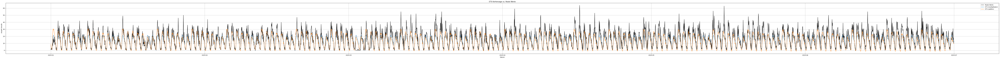

ETS (multiplikativ):
MAE: 5.61, MSE: 63.87, RMSE: 7.99, MAPE: 42.32%

ETS (additiv):
MAE: 5.38, MSE: 54.48, RMSE: 7.38, MAPE: 44.34%



In [1004]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error

# Vorhersage für den Testzeitraum
y_test_ets = df_hourly_test['calls']

# Punktprognosen
y_pred_mul = ets_model.forecast(len(y_test_ets))
y_pred_add = ets_model_add.forecast(len(y_test_ets))

# Plot
plt.figure(figsize=(100, 6))
plt.plot(y_test_ets.index, y_test_ets, label='Reale Werte', color='black')
plt.plot(y_test_ets.index, y_pred_mul, label='ETS (multiplikativ)', linestyle='-')
plt.plot(y_test_ets.index, y_pred_add, label='ETS (additiv)', linestyle='-')
plt.title('ETS-Vorhersage vs. Reale Werte')
plt.xlabel('Datum')
plt.ylabel('Anzahl Anrufe')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Fehlermetriken
def print_metrics(y_true, y_pred, label):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mask = y_test_ets != 0
    mape = mean_absolute_percentage_error(y_test_ets[mask], y_pred[mask])
    print(f"{label}:\nMAE: {mae:.2f}, MSE: {mse:.2f}, RMSE: {rmse:.2f}, MAPE: {mape:.2%}\n")

print_metrics(y_test_ets, y_pred_mul, "ETS (multiplikativ)")
print_metrics(y_test_ets, y_pred_add, "ETS (additiv)")


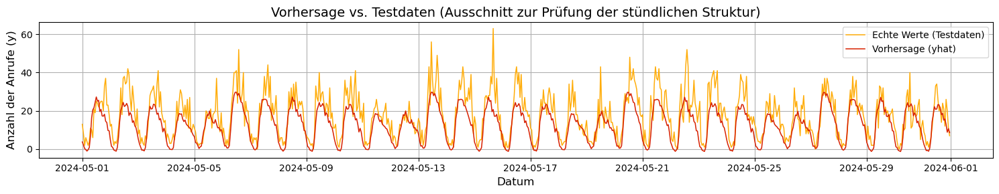

Plot gespeichert als 'sarimax_forecast_vs_test.png'


In [1097]:
ets_y_pred = y_pred_add

plot_forecast_vs_actual(
    forecast=ets_y_pred,
    test_data=df_hourly_test,
    start_date="2024-05-01",
    end_date="2024-05-31 23:00:00",
    color=colors[0],
    filename="sarimax_forecast_vs_test.png"
)

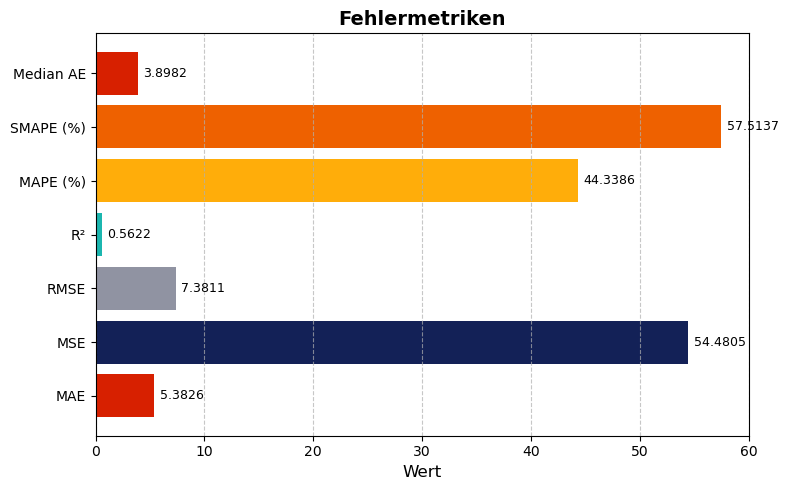

Fehlermetriken gespeichert als 'ets_fehler.png'.


In [1005]:
plot_error_metrics(y_test_ets, ets_y_pred, filename="ets_fehler.png")

# XGBoost Modelltraining

In [157]:
df = df_hourly_time_modified.copy()
df['hour'] = df.index.hour
df['dayofweek'] = df.index.dayofweek
df['month'] = df.index.month

# Zielvariable
df['y'] = df['calls']

# Train/test split (z. B. letztes Monat als Test)
split_date = df.index[-30*24]  # letzter Monat = 30 Tage * 24 Stunden
df_train = df[df.index < split_date]
df_test = df[df.index >= split_date]

X_train = df_train.drop(columns=['calls', 'y'])
y_train = df_train['y']
X_test = df_test.drop(columns=['calls', 'y'])
y_test = df_test['y']

In [ ]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error

def objective_hourly(trial):
    params = {
        "objective": "reg:squarederror",
        "n_estimators": trial.suggest_int("n_estimators", 50, 300),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "learning_rate": trial.suggest_loguniform("learning_rate", 0.01, 0.3),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "reg_alpha": trial.suggest_loguniform("reg_alpha", 1e-5, 1.0),
        "reg_lambda": trial.suggest_loguniform("reg_lambda", 1e-5, 1.0),
    }

    model = xgb.XGBRegressor(**params)
    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)

    return mse

# Optuna starten
xgb_study = optuna.create_study(direction="minimize")
xgb_study.optimize(objective_hourly, n_trials=50)

# Beste Parameter
print("Beste Hyperparameter für df_hourly_time_modified:", xgb_study.best_params)


[I 2025-04-13 13:08:59,029] A new study created in memory with name: no-name-5d90d381-171c-4c74-bc1a-8f10435f5d5b
[I 2025-04-13 13:08:59,822] Trial 0 finished with value: 0.0592944361269474 and parameters: {'n_estimators': 294, 'max_depth': 4, 'learning_rate': 0.02117496175592143, 'subsample': 0.9301693723200168, 'colsample_bytree': 0.9380644681069323, 'reg_alpha': 2.4945497290819396e-05, 'reg_lambda': 0.13775381371373163}. Best is trial 0 with value: 0.0592944361269474.
[I 2025-04-13 13:09:01,981] Trial 1 finished with value: 0.7775543332099915 and parameters: {'n_estimators': 151, 'max_depth': 10, 'learning_rate': 0.055170479816591504, 'subsample': 0.9426766239506983, 'colsample_bytree': 0.5026429716219893, 'reg_alpha': 0.1779679658975381, 'reg_lambda': 0.26544245185090837}. Best is trial 0 with value: 0.0592944361269474.
[I 2025-04-13 13:09:02,670] Trial 2 finished with value: 0.023551223799586296 and parameters: {'n_estimators': 235, 'max_depth': 4, 'learning_rate': 0.0378846539756

Beste Hyperparameter für df_hourly_time_modified: {'n_estimators': 289, 'max_depth': 4, 'learning_rate': 0.18258405252568347, 'subsample': 0.6527519902243076, 'colsample_bytree': 0.9801549982275644, 'reg_alpha': 0.0634590459735426, 'reg_lambda': 0.00014824686099627058}


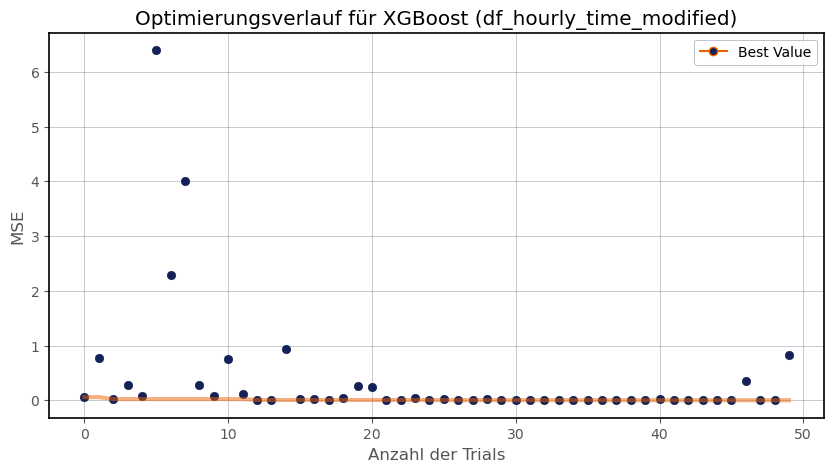

In [159]:
import matplotlib.pyplot as plt
from optuna.visualization.matplotlib import plot_optimization_history
from matplotlib.lines import Line2D

# Plot erstellen für XGBoost-HPO
ax = plot_optimization_history(xgb_study)
fig = ax.figure
fig.set_size_inches(10, 5)

# Farben definieren
line_color = '#EE6100FF'     # orange
point_color = '#132157FF'    # dunkelblau
grid_color = '#9093A2FF'     # grau
background_color = '#ffffff'
spine_color = 'black'

# Linienfarbe und -breite anpassen
for line in ax.get_lines():
    line.set_color(line_color)
    line.set_linewidth(3)

# Punkte (Scatter) einfärben
for collection in ax.collections:
    collection.set_facecolor(point_color)
    collection.set_edgecolor(point_color)

# Hintergrundfarbe
ax.set_facecolor(background_color)
fig.patch.set_facecolor(background_color)

# Gitterlinien
ax.grid(color=grid_color, linestyle='-', linewidth=0.5, alpha=0.7)

# Rahmen (Spines)
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.2)
    spine.set_color(spine_color)

# Achsentitel und Plot-Titel
ax.set_xlabel("Anzahl der Trials")
ax.set_ylabel("MSE")
ax.set_title("Optimierungsverlauf für XGBoost (df_hourly_time_modified)")

# Legende ersetzen
legend = ax.get_legend()
if legend:
    legend.remove()

custom_legend = [
    Line2D([0], [0], marker="o", color=line_color, label="Best Value", 
           markerfacecolor=point_color, linestyle="-")
]
ax.legend(handles=custom_legend, loc="best", facecolor=background_color, edgecolor=grid_color)

# Grafik speichern oder anzeigen
fig.savefig("xgboost_optuna_hourly.png", dpi=300, bbox_inches="tight")
plt.show()


In [539]:
def prepare_xgboost_data(df, lags=24):
    df = df.copy()

    # Index in datetime-Format bringen (falls noch nicht)
    if not isinstance(df.index, pd.DatetimeIndex):
        df.index = pd.to_datetime(df.index)

    ds = df.index
    df["y"] = df["calls_boxcox"]  # oder "calls_log", je nachdem was du nutzt

    # 👉 Lag-Features wieder aktivieren
    for lag in range(1, lags + 1):
        df[f"lag_{lag}"] = df["y"].shift(lag)

    # # Differenzierung (1 Tag = 24 Stunden)
    # df["diff_24"] = df["y"] - df["y"].shift(24)

    # Variante 1: Differenz über 7 Tage (168 Stunden)
    # df["diff_168"] = df["y"] - df["y"].shift(168)

    # # Variante 2: Prozentuale Veränderung (gegenüber 24h vorher)
    # df["pct_change_24"] = df["y"].pct_change(24)
    # df["pct_change_24"] = df["pct_change_24"].clip(lower=-10, upper=10).fillna(0)


    # Variante 3: Gleitender Mittelwert über 24 Stunden
    df["rolling_mean_24"] = df["y"].rolling(window=24).mean()

    # Zeitbasierte Features
    df["hour"] = ds.hour
    df["day"] = ds.day
    df["dayofyear"] = ds.dayofyear
    df["weekday"] = ds.weekday
    df["month"] = ds.month
    df["year"] = ds.year
    df["is_weekend"] = ds.weekday >= 5


    # NaNs entfernen
    df = df.dropna()

    # Nicht benötigte Spalten entfernen – alles außer die Zielvariable und Feature-Spalten
    columns_to_drop = ["calls", "calls_log", "calls_boxcox", "dayofweek"]  # nur eine dieser Variablen soll Zielwert sein
    df = df.drop(columns=[col for col in columns_to_drop if col in df.columns and col != "y"])


    return df


In [509]:
# --- Modelltraining und Vorhersage ---
def make_prediction(train_df, test_df, study):
    X_train = train_df.drop(columns=["y"], errors="ignore")
    y_train = train_df["y"]
    X_test = test_df.drop(columns=["y"], errors="ignore")
    y_test = test_df["y"]

    # Gleiche Features sicherstellen
    common_cols = X_train.columns.intersection(X_test.columns)
    X_train = X_train[common_cols]
    X_test = X_test[common_cols]

    best_params = {
        'n_estimators': 289, 
        'max_depth': 4, 
        'learning_rate': 0.07, 
        'subsample': 0.6527519902243076, 
        'colsample_bytree': 0.9801549982275644, 
        'reg_alpha': 0.1, 
        'reg_lambda': 1
    }

    best_params["objective"] = "reg:squarederror"

    model = xgb.XGBRegressor(**best_params)
    model.fit(X_train, y_train)

    y_pred_log = model.predict(X_test)
    return y_test, y_pred_log, model


In [ ]:
# # Trainings- und Testdaten vorbereiten
# # ungenutzt, weil das Modell mit den transformierten Daten trainiert wird -> Box-Cox

# df_hourly_train_xgb = prepare_xgboost_data(df_hourly_time_modified, lags=168)
# df_hourly_test_xgb = prepare_xgboost_data(df_hourly_test, lags=168)

# # Modelltraining + Vorhersage direkt auf den echten Werten
# y_test, y_pred, xgb_model = make_prediction(df_hourly_train_xgb, df_hourly_test_xgb, xgb_study)


In [ ]:
# # Training- und Testdaten logarithmisch vorbereiten
# # unbenötigt, weil das Modell mit den transformierten Daten trainiert wird -> Box-Cox
# df_hourly_time_modified["calls_log"] = np.log1p(df_hourly_time_modified["calls"])
# df_hourly_test["calls_log"] = np.log1p(df_hourly_test["calls"])

# df_hourly_train_xgb = prepare_xgboost_data(df_hourly_time_modified, lags=168)
# df_hourly_test_xgb = prepare_xgboost_data(df_hourly_test, lags=168)

# y_test_log, y_pred_log, xgb_model = make_prediction(df_hourly_train_xgb, df_hourly_test_xgb, xgb_study)

# # Rücktransformation
# y_test = np.expm1(y_test_log)
# y_pred = np.expm1(y_pred_log)

In [1039]:
# Box-Cox-Transformation der Daten

from scipy.stats import boxcox
from scipy.special import inv_boxcox

# 1. Kopieren der DataFrames – gut!
df_hourly_time_modified = df_hourly_time_modified.copy()
df_hourly_test = df_hourly_test.copy()

# 2. Box-Cox-Transformation – richtig!
# Achtung: calls + 1 wegen möglicher 0-Werte
df_hourly_time_modified["calls_boxcox"], fitted_lambda = boxcox(df_hourly_time_modified["calls"] + 1)
df_hourly_test["calls_boxcox"] = boxcox(df_hourly_test["calls"] + 1, lmbda=fitted_lambda)

# 3. Datensatz vorbereiten – wichtig: prepare_xgboost_data() muss calls_boxcox als Zielwert y verwenden
df_hourly_train_xgb = prepare_xgboost_data(df_hourly_time_modified, lags=168)
df_hourly_test_xgb = prepare_xgboost_data(df_hourly_test, lags=168)
# Jetzt: Index speichern, den XGBoost später für die Vorhersage verwenden wird
xgb_forecast_index = df_hourly_test_xgb.index

# 4. Modelltraining + Vorhersage
y_test_boxcox, y_pred_boxcox, xgb_model = make_prediction(df_hourly_train_xgb, df_hourly_test_xgb, xgb_study)

# 5. Rücktransformation der Vorhersage
xgb_y_pred = pd.Series(inv_boxcox(y_pred_boxcox, fitted_lambda) - 1, index=xgb_forecast_index)
y_test = inv_boxcox(y_test_boxcox, fitted_lambda) - 1

Anpassungen:
- logarithmus von calls
- mehr zeitkomponenten
- erhöhung baumtiefe von 4 auf 8
- verringerung der learning rate für generaliserbarkeit von 0.18258405252568347 auf 0.07
- veränderung Regularisierungsparameter reg_alpha von 
        'reg_alpha': 0.0634590459735426 auf 0.1 und
        'reg_lambda': 0.00014824686099627058 auf 1
- X log 
- boxcox
- X differenzierung 24, 168
- X pct_range_24
- rolling mean 24

### Einschätzung des Modells

In [902]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Berechnung der Metriken
mae = mean_absolute_error(y_test, xgb_y_pred)
mse = mean_squared_error(y_test, xgb_y_pred)
rmse = np.sqrt(mse)  # RMSE manuell berechnet
r2 = r2_score(y_test, xgb_y_pred)

print(f"MAE: {mae}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")


MAE: 4.198405726764883
MSE: 33.57193609736393
RMSE: 5.794129451208692
R²: 0.7316259136191895


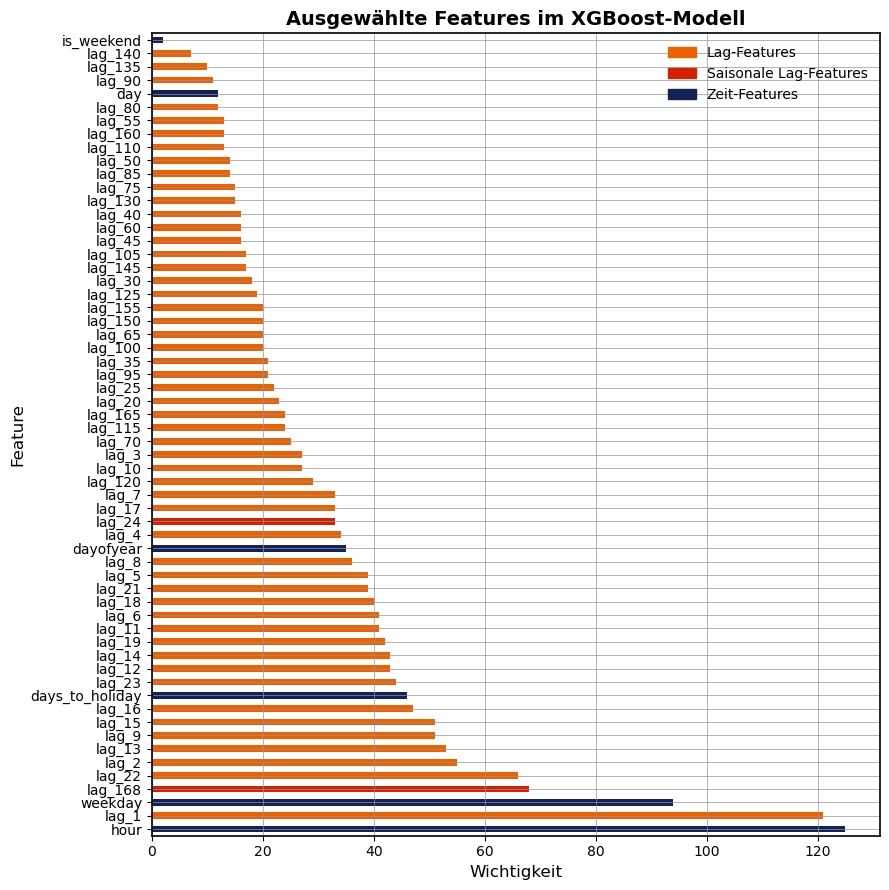

In [545]:
import matplotlib.pyplot as plt
import pandas as pd

# Farben definieren
lag_color = '#EE6100FF'
lag_important_color = '#D72000FF'
time_color = '#132157FF'


# Gewünschte Lags und Zeitfeatures bestimmen
lag_features = (
    [f"lag_{i}" for i in range(1, 25)] +             # lag_1 bis lag_25
    [f"lag_{i}" for i in range(25, 166, 5)]          # jeder 5. von lag_25 bis lag_165
)
lag_important = ["lag_24"] + ["lag_168"]
time_features = ["days_to_holiday", "weekday", "hour", "day", "dayofyear", "is_weekend", "week"]
# Kombinierte Liste der gewünschten Features
wanted_lags = lag_features + lag_important + time_features

# Importance-Werte extrahieren
booster = xgb_model.get_booster()
score = booster.get_score(importance_type='weight')
score_series = pd.Series(score)

# Filtere nur die gewünschten Features
score_filtered = score_series[score_series.index.isin(wanted_lags)]
score_filtered = score_filtered.sort_values(ascending=False)

# Farben für die Balken zuweisen
colors = [
    lag_important_color if feat in lag_important 
    else lag_color if feat in lag_features 
    else time_color
    for feat in score_filtered.index
]

# Plot
plt.style.use('default')
fig, ax = plt.subplots(figsize=(9, 9))
score_filtered.plot(kind='barh', color=colors, ax=ax)

# Gitterlinien und Rahmen stylen
ax.grid(True, which='major', linestyle='-', linewidth=0.5, color='#9093A2FF')
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.2)
    spine.set_color('black')

# Titel und Achsenbeschriftungen
ax.set_title("Ausgewählte Features im XGBoost-Modell", fontsize=14, weight='bold')
ax.set_xlabel("Wichtigkeit", fontsize=12)
ax.set_ylabel("Feature", fontsize=12)

# Legende manuell hinzufügen
from matplotlib.patches import Patch
legend_handles = [
    Patch(color=lag_color, label='Lag-Features'),
    Patch(color=lag_important_color, label='Saisonale Lag-Features'),
    Patch(color=time_color, label='Zeit-Features')
]
ax.legend(handles=legend_handles, loc='upper right', frameon=False)

plt.tight_layout()
plt.show()


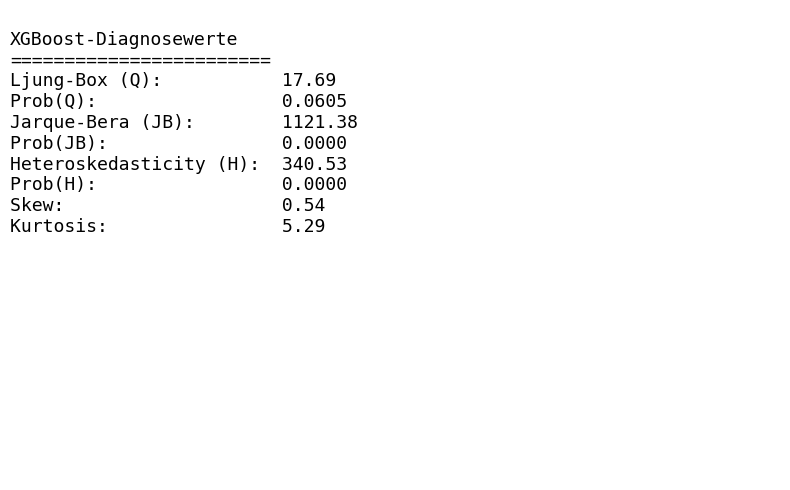

In [ ]:
import matplotlib.pyplot as plt
from scipy import stats
from statsmodels.stats.diagnostic import acorr_ljungbox, het_breuschpagan
from statsmodels.stats.stattools import jarque_bera
from statsmodels.tools.tools import add_constant

# Standardisierte Residuen berechnen
residuals = y_test - xgb_y_pred
standardized_residuals = (residuals - np.mean(residuals)) / np.std(residuals)

# Ljung-Box Test
ljung_box = acorr_ljungbox(residuals, lags=[10], return_df=True)

# Jarque-Bera Test
jb_stat, jb_pvalue, skew, kurtosis = jarque_bera(residuals)

# Heteroskedastizität (Breusch-Pagan)
X = add_constant(pd.DataFrame(y_pred))  # oder die verwendeten Features
bp_test = het_breuschpagan(residuals, X)
bp_stat, bp_pvalue = bp_test[0], bp_test[1]
# Inhalt vorbereiten
text = f"""
XGBoost-Diagnosewerte
========================
Ljung-Box (Q):           {ljung_box['lb_stat'].iloc[0]:.2f}
Prob(Q):                 {ljung_box['lb_pvalue'].iloc[0]:.4f}
Jarque-Bera (JB):        {jb_stat:.2f}
Prob(JB):                {jb_pvalue:.4f}
Heteroskedasticity (H):  {bp_stat:.2f}
Prob(H):                 {bp_pvalue:.4f}
Skew:                    {skew:.2f}
Kurtosis:                {kurtosis:.2f}
"""

# Grafik erzeugen
fig, ax = plt.subplots(figsize=(8, 5))
ax.axis("off")
ax.text(0, 1, text, fontsize=13, fontfamily="monospace", va="top")
plt.tight_layout()
plt.savefig("xgb_diagnostics_clean.png", dpi=300)
plt.show()


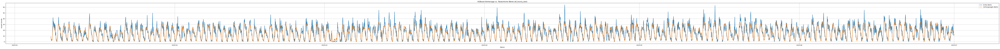

In [903]:
import matplotlib.pyplot as plt

# Zeitindex aus Original-Testdaten holen (vor dem Preprocessing)
time_index = df_hourly_test.dropna().index[-len(y_test):]  # gleiche Länge wie y_test

# Plotten
plt.figure(figsize=(100, 5))
plt.plot(time_index, y_test.values, label='Echte Werte', linewidth=2)
plt.plot(time_index, xgb_y_pred, label='Vorhergesagte Werte', linewidth=2)
plt.title("XGBoost-Vorhersage vs. Tatsächliche Werte (df_hourly_test)")
plt.xlabel("Datum")
plt.ylabel("Anzahl Anrufe")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


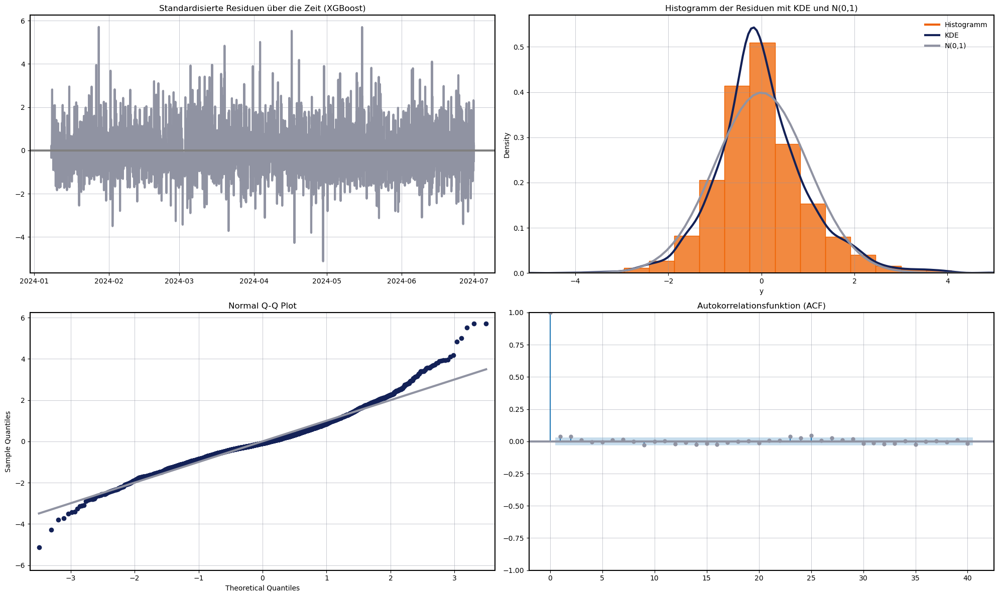

In [904]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf
from scipy import stats

# Residuen berechnen
residuals = y_test - xgb_y_pred

# Standardisierte Residuen berechnen
standardized_residuals = (residuals - np.mean(residuals)) / np.std(residuals)

# 2x2 Plot-Layout erstellen
fig, axes = plt.subplots(2, 2, figsize=(20, 12))
axes = axes.flatten()

# Farben definieren
line_color = '#9093A2FF'
gray = '#9093A2FF'
kde_color = '#9093A2FF'
point_color = '#132157FF'
blue = '#132157FF'
hist_color = '#EE6100FF'
orange = '#EE6100FF'
norm_color = '#9093A2FF'
background_color = '#ffffff'
grid_color = '#9093A2FF'
spine_color = 'black'
line_width = 3

# 1. Standardisierte Residuen über die Zeit
axes[0].plot(standardized_residuals, color=line_color, linewidth=line_width)
axes[0].axhline(0, linestyle='-', color='gray')
axes[0].set_title('Standardisierte Residuen über die Zeit (XGBoost)')
axes[0].set_facecolor(background_color)
axes[0].grid(color=grid_color, linestyle='-', linewidth=0.5, alpha=0.7)

# 2. Histogramm der Residuen mit KDE und Normalverteilung
sns.histplot(standardized_residuals, bins=20, kde=False, stat="density", ax=axes[1],
             color=hist_color, edgecolor=hist_color)
sns.kdeplot(standardized_residuals, ax=axes[1], color=blue, linewidth=line_width)
xmin, xmax = axes[1].get_xlim()
x = np.linspace(xmin, xmax, 100)
p = stats.norm.pdf(x, 0, 1)
axes[1].plot(x, p, color=gray, linewidth=line_width)
axes[1].set_xlim(-5, 5)
axes[1].set_title('Histogramm der Residuen mit KDE und N(0,1)')
axes[1].set_facecolor(background_color)
axes[1].grid(color=gray, linestyle='-', linewidth=0.5, alpha=0.7)

# Legende hinzufügen
handles = [
    plt.Line2D([0], [0], color=hist_color, lw=line_width, label='Histogramm'),
    plt.Line2D([0], [0], color=blue, lw=line_width, label='KDE'),
    plt.Line2D([0], [0], color=gray, lw=line_width, label='N(0,1)')
]
axes[1].legend(handles=handles, loc='upper right', frameon=False)

# 3. Normal Q-Q Plot
sm.qqplot(standardized_residuals, line='s', ax=axes[2])
ax = axes[2]
# Linie (Diagonale)
ax.get_lines()[1].set_color(gray)
ax.get_lines()[1].set_linewidth(line_width)
# Punkte einfärben
ax.get_lines()[0].set_color(blue)
ax.get_lines()[0].set_markerfacecolor(blue)
ax.get_lines()[0].set_markeredgecolor(blue)
ax.set_title('Normal Q-Q Plot')
ax.set_facecolor(background_color)
ax.grid(color=grid_color, linestyle='-', linewidth=0.5, alpha=0.7)
ymin, ymax = ax.get_ylim()
max_abs = max(abs(ymin), abs(ymax))
ax.set_ylim(-max_abs, max_abs)


# 4. Autokorrelationsfunktion (ACF)
acf_plot = plot_acf(standardized_residuals, ax=axes[3], lags=40, color=blue)  # bars in blue

axes[3].set_title('Autokorrelationsfunktion (ACF)')
axes[3].set_facecolor(background_color)
axes[3].grid(color=grid_color, linestyle='-', linewidth=0.5, alpha=0.7)

# Konfidenzintervall-Farbe anpassen
for patch in axes[3].patches:
    patch.set_edgecolor(gray)
    patch.set_facecolor(blue)

for line in axes[3].lines:
    line.set_color(gray)
    line.set_linewidth(line_width)


# Rahmen (Spines) und Linienbreite anpassen
for ax in axes:
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1.5)
        spine.set_color(spine_color)
    for line in ax.get_lines():
        line.set_linewidth(line_width)

# Layout anpassen und anzeigen
plt.tight_layout()
plt.show()


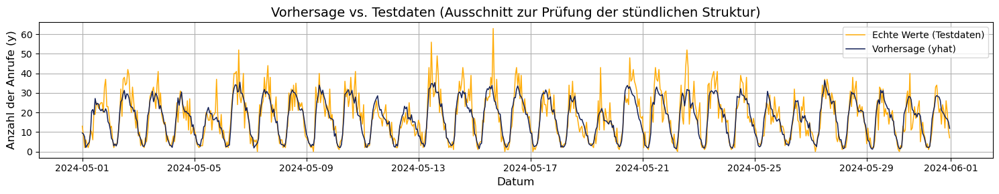

Plot gespeichert als 'xgb_forecast_vs_test.png'


In [1098]:
# # Kürze die Zeitstempel auf die Länge der Vorhersage
# timestamps = df_hourly_test.index[:len(xgb_y_pred)]

# # Erstelle das Forecast-Seriesobjekt mit Zeitstempel im Index
# xgb_y_pred = pd.Series(xgb_y_pred.squeeze(), index=timestamps, name="calls")
# # Testdaten ebenfalls kürzen und vorbereiten
# test_df = df_hourly_test[["calls"]].iloc[:len(xgb_y_pred)]

# Funktionsaufruf
plot_forecast_vs_actual(
    forecast=xgb_y_pred,
    test_data=test_df,
    start_date="2024-05-01",
    end_date="2024-05-31 23:00:00",
    color=colors[5],
    filename="xgb_forecast_vs_test.png"
)


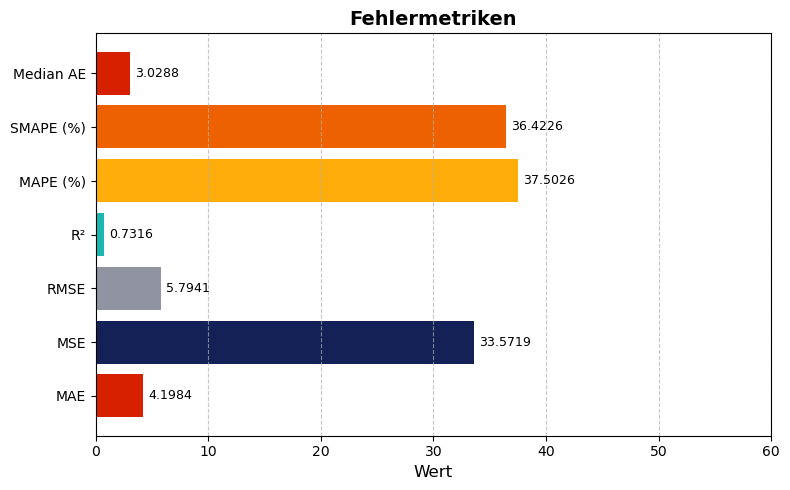

Fehlermetriken gespeichert als 'xgb_fehler.png'.


In [1042]:
plot_error_metrics(y_test, xgb_y_pred, filename="xgb_fehler.png")

# Prophet Modellierung

In [553]:
df_hourly_time_modified

,calls,days_to_holiday,weekday,calls_log,calls_boxcox
date,,,,,
2022-01-01 00:00:00,2,0,5,1.098612,1.447127
2022-01-01 01:00:00,0,0,5,0.000000,0.000000
2022-01-01 02:00:00,1,0,5,0.693147,0.822537
2022-01-01 03:00:00,2,0,5,1.098612,1.447127
2022-01-01 04:00:00,2,0,5,1.098612,1.447127
...,...,...,...,...,...
2023-12-31 19:00:00,13,1,6,2.639057,5.315345
2023-12-31 20:00:00,12,1,6,2.564949,5.056594
2023-12-31 21:00:00,8,1,6,2.197225,3.900531


### Optuna Hyperparameteroptimierung

In [556]:
import optuna
from prophet import Prophet
from sklearn.metrics import mean_absolute_error
import pandas as pd

def optimize_prophet_for_df(df, test_ratio=0.2, n_trials=50):
    # Index zurück in Spalte 'ds', Zielvariable in 'y' umbenennen
    df = df.copy()
    df = df.reset_index()  # 'date' wird wieder zu Spalte
    df.rename(columns={'date': 'ds', 'calls': 'y'}, inplace=True)
    df = df[['ds', 'y']].sort_values('ds')

    # Training/Test Split
    split_idx = int(len(df) * (1 - test_ratio))
    df_train = df.iloc[:split_idx]
    df_test = df.iloc[split_idx:]

    # Optuna-Ziel-Funktion
    def objective(trial):
        changepoint_prior_scale = trial.suggest_float('changepoint_prior_scale', 0.001, 0.5, log=True)
        seasonality_prior_scale = trial.suggest_float('seasonality_prior_scale', 0.01, 10, log=True)

        model = Prophet(
            changepoint_prior_scale=changepoint_prior_scale,
            seasonality_prior_scale=seasonality_prior_scale,
            daily_seasonality=True,
            weekly_seasonality=True,
            yearly_seasonality=False
        )
        model.fit(df_train)

        future = model.make_future_dataframe(periods=len(df_test), freq="H")
        forecast = model.predict(future)

        # MAE berechnen
        mae = mean_absolute_error(df_test["y"].values, forecast["yhat"].values[-len(df_test):])
        return mae

    # Optuna-Studie
    study = optuna.create_study(direction="minimize")
    study.optimize(objective, n_trials=n_trials)

    print(f"Beste Hyperparameter:\n{study.best_params}")

    # Bestes Modell nochmal trainieren
    best_model = Prophet(**study.best_params)
    best_model.fit(df_train)

    return best_model, study

# Anwendung auf df_hourly_time_modified
prophet_best_model, prophet_study = optimize_prophet_for_df(df_hourly_time_modified, test_ratio=0.2, n_trials=50)


[I 2025-04-15 07:05:16,740] A new study created in memory with name: no-name-0680aa5a-2927-4948-b30a-4cda2eaa390f
07:05:19 - cmdstanpy - INFO - Chain [1] start processing
07:05:23 - cmdstanpy - INFO - Chain [1] done processing
[I 2025-04-15 07:05:28,873] Trial 0 finished with value: 4.647295903767439 and parameters: {'changepoint_prior_scale': 0.01616487958762951, 'seasonality_prior_scale': 0.14145088216484672}. Best is trial 0 with value: 4.647295903767439.
07:05:31 - cmdstanpy - INFO - Chain [1] start processing
07:05:34 - cmdstanpy - INFO - Chain [1] done processing
[I 2025-04-15 07:05:39,264] Trial 1 finished with value: 4.621381995763769 and parameters: {'changepoint_prior_scale': 0.0014607409634752647, 'seasonality_prior_scale': 0.03188578296205861}. Best is trial 1 with value: 4.621381995763769.
07:05:41 - cmdstanpy - INFO - Chain [1] start processing
07:05:49 - cmdstanpy - INFO - Chain [1] done processing
[I 2025-04-15 07:05:53,144] Trial 2 finished with value: 4.61703250318102

Beste Hyperparameter:
{'changepoint_prior_scale': 0.055832208292499186, 'seasonality_prior_scale': 7.837042117990147}


07:13:44 - cmdstanpy - INFO - Chain [1] start processing
07:13:47 - cmdstanpy - INFO - Chain [1] done processing


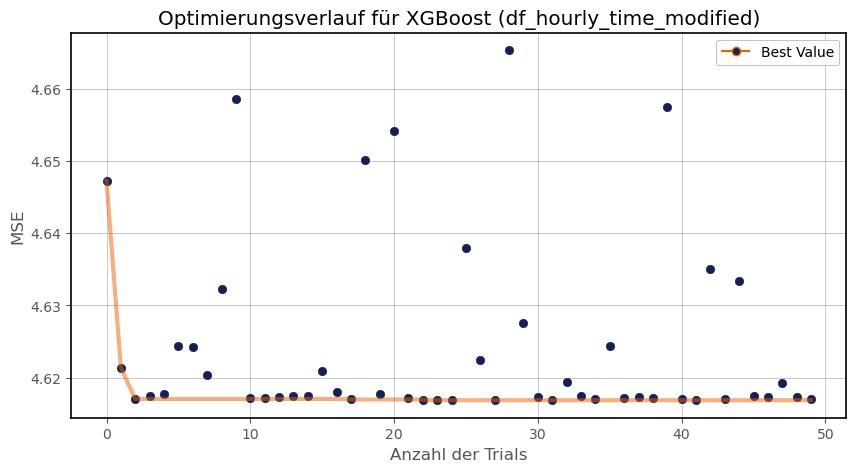

In [ ]:
import matplotlib.pyplot as plt
from optuna.visualization.matplotlib import plot_optimization_history
from matplotlib.lines import Line2D

# Plot erstellen für XGBoost-HPO
ax = plot_optimization_history(prophet_study)
fig = ax.figure
fig.set_size_inches(10, 5)

# Farben definieren
line_color = '#EE6100FF'     # orange
point_color = '#132157FF'    # dunkelblau
grid_color = '#9093A2FF'     # grau
background_color = '#ffffff'
spine_color = 'black'

# Linienfarbe und -breite anpassen
for line in ax.get_lines():
    line.set_color(line_color)
    line.set_linewidth(3)

# Punkte (Scatter) einfärben
for collection in ax.collections:
    collection.set_facecolor(point_color)
    collection.set_edgecolor(point_color)

# Hintergrundfarbe
ax.set_facecolor(background_color)
fig.patch.set_facecolor(background_color)

# Gitterlinien
ax.grid(color=grid_color, linestyle='-', linewidth=0.5, alpha=0.7)

# Rahmen (Spines)
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.2)
    spine.set_color(spine_color)

# Achsentitel und Plot-Titel
ax.set_xlabel("Anzahl der Trials")
ax.set_ylabel("MAE")
ax.set_title("Optimierungsverlauf für XGBoost (df_hourly_time_modified)")

# Legende ersetzen
legend = ax.get_legend()
if legend:
    legend.remove()

custom_legend = [
    Line2D([0], [0], marker="o", color=line_color, label="Best Value", 
           markerfacecolor=point_color, linestyle="-")
]
ax.legend(handles=custom_legend, loc="best", facecolor=background_color, edgecolor=grid_color)

# Grafik speichern oder anzeigen
fig.savefig("xgboost_optuna_hourly.png", dpi=300, bbox_inches="tight")
plt.show()

In [ ]:
# Erstellen des Dataframes für Prophet
df_prophet = df_hourly_time_modified.reset_index()[["date", "calls", "weekday"]].copy()
df_prophet.rename(columns={"date": "ds", "calls": "y"}, inplace=True)
df_prophet["hour"] = df_prophet["ds"].dt.hour
df_prophet["year"] = df_prophet["ds"].dt.year
# Lag-Werte (Lag für 1, 2, 3, 4, 5, 6, 7, 23, 24, 25 und 168 Stunden)
df_prophet["lag_1"] = df_prophet["y"].shift(1)  # 1 Stunde Lag
df_prophet["lag_2"] = df_prophet["y"].shift(2)  # 2 Stunden Lag
df_prophet["lag_3"] = df_prophet["y"].shift(3)  # 3 Stunden Lag
df_prophet["lag_4"] = df_prophet["y"].shift(4)  # 4 Stunden Lag
df_prophet["lag_7"] = df_prophet["y"].shift(7)  # 7 Stunden Lag
df_prophet["lag_23"] = df_prophet["y"].shift(23)  # 23 Stunden Lag
df_prophet["lag_25"] = df_prophet["y"].shift(25)  # 25 Stunden Lag
df_prophet["lag_168"] = df_prophet["y"].shift(168)  # 168 Stunden Lag (1 Woche)



# Erstellen des Testdatensatzes
# df_hourly_test den Index "date" hat, bring ihn in Prophet-kompatible Form
df_prophet_test = df_hourly_test.reset_index()[["date", "calls", "weekday"]].copy()
df_prophet_test.rename(columns={"date": "ds", "calls": "y"}, inplace=True)
df_prophet_test["hour"] = df_prophet_test["ds"].dt.hour
df_prophet_test["year"] = df_prophet_test["ds"].dt.year
# Lag-Werte (Lag für 1, 2, 3, 4, 5, 6, 7, 23, 24, 25 und 168 Stunden)
df_prophet_test["lag_1"] = df_prophet_test["y"].shift(1)  # 1 Stunde Lag
df_prophet_test["lag_2"] = df_prophet_test["y"].shift(2)  # 2 Stunden Lag
df_prophet_test["lag_3"] = df_prophet_test["y"].shift(3)  # 3 Stunden Lag
df_prophet_test["lag_4"] = df_prophet_test["y"].shift(4)  # 4 Stunden Lag
df_prophet_test["lag_7"] = df_prophet_test["y"].shift(7)  # 7 Stunden Lag
df_prophet_test["lag_23"] = df_prophet_test["y"].shift(23)  # 23 Stunden Lag
df_prophet_test["lag_25"] = df_prophet_test["y"].shift(25)  # 25 Stunden Lag
df_prophet_test["lag_168"] = df_prophet_test["y"].shift(168)  # 168 Stunden Lag (1 Woche)


In [848]:
# Da durch lag_24 und lag_168 NaN-Werte entstehen, diese mit 0 füllen
df_prophet.fillna(0, inplace=True)
df_prophet_test.fillna(0, inplace=True)

In [851]:
from prophet import Prophet

# Beste Parameter extrahieren
best_params = prophet_study.best_params
best_params['changepoint_prior_scale'] = 0.5 # statt z. B. 0.05
best_params['seasonality_mode'] = 'multiplicative'  # oder 'multiplicative', je nach Bedarf

# Prophet-Instanz erstellen
prophet_model = Prophet(**best_params)

# alle Regressoren hinzufügen
for reg in ['weekday', 'hour', 'year', 'lag_1', 'lag_2', 'lag_3', 'lag_23', 'lag_25', 'lag_168', 'lag_4', 'lag_7']:
    prophet_model.add_regressor(reg)

# Modell trainieren – df_prophet muss die Spalten: ['ds', 'y', 'days_to_holiday'] enthalten!
prophet_model.fit(df_prophet)

10:45:21 - cmdstanpy - INFO - Chain [1] start processing
10:45:35 - cmdstanpy - INFO - Chain [1] done processing


In [868]:
print("Beste Parameter aus Optuna:")
for param, value in best_params.items():
    print(f"{param}: {value}")


Beste Parameter aus Optuna:
changepoint_prior_scale: 0.5
seasonality_prior_scale: 7.837042117990147
seasonality_mode: multiplicative


Änderungen:
- Hinzufügen der besten Parameter aus Optuna
- Hinzufügen von 'days_to_holiday'
- > weiterhin zu starke Glättung
- Trenddynamik erhöhen ['changepoint_prior_scale'] = 0.5 von 0.05
- hinzufügen von regressoren: 'days_to_holiday', 'hour', 'weekday', 'is_weekend', 'month', 'year', 'day_of_year', 'week_of_year', 'quarter_of_year', 'lag_24', 'lag_168'
- aussortieren der regressoren mit negativem Effekt laut Permutation Importance Analyse: 'days_to_holiday' und 'month'
- nach weiterem durchgang dann quarter_of_year
- dann wenig relevante is_weekend
- dann wenig relevante hour, week_of_year -> dadurch wieder verschlechterung der Werte, deswegen rückgängig
- wegen starker Autokorrelatoion: hinzufügen von 'lag_1'
- wegen verbleibender Autokorrelation, hinzufügen von 'lag_2' und 'lag_3'
- wegen auffälligkeiten im acf plot: 'lag_23'
- und lag 4, 5, 6, 7
- Täler und Spitzen immer nicht erfasst -> Modell zu glatt: Änderung best_params['seasonality_mode'] = 'multiplicative' von 'additive'
- dadurch lag_5, _6, _24 und weekofyear -> negativen Einfluss auf Modell -> löschen


In [852]:
# Anzahl Stunden für den Forecast (so lang wie df_hourly_test)
n_hours = len(df_hourly_test)

# Zukunft erzeugen
future = prophet_model.make_future_dataframe(periods=n_hours, freq='H')

# Vorbereitung: DataFrame mit 'ds' und 'days_to_holiday' zur Verknüpfung
future = pd.concat([
    df_prophet[['ds', 'weekday', 'hour', 'year', 'lag_1', 'lag_2', 'lag_3', 'lag_23', 'lag_25', 'lag_168', 'lag_4', 'lag_7']],
    df_prophet_test[['ds', 'weekday', 'hour', 'year', 'lag_1', 'lag_2', 'lag_3', 'lag_23', 'lag_25', 'lag_168', 'lag_4', 'lag_7']]
])
future = future.reset_index(drop=True)
# Vorhersage erstellen
forecast = prophet_model.predict(future)


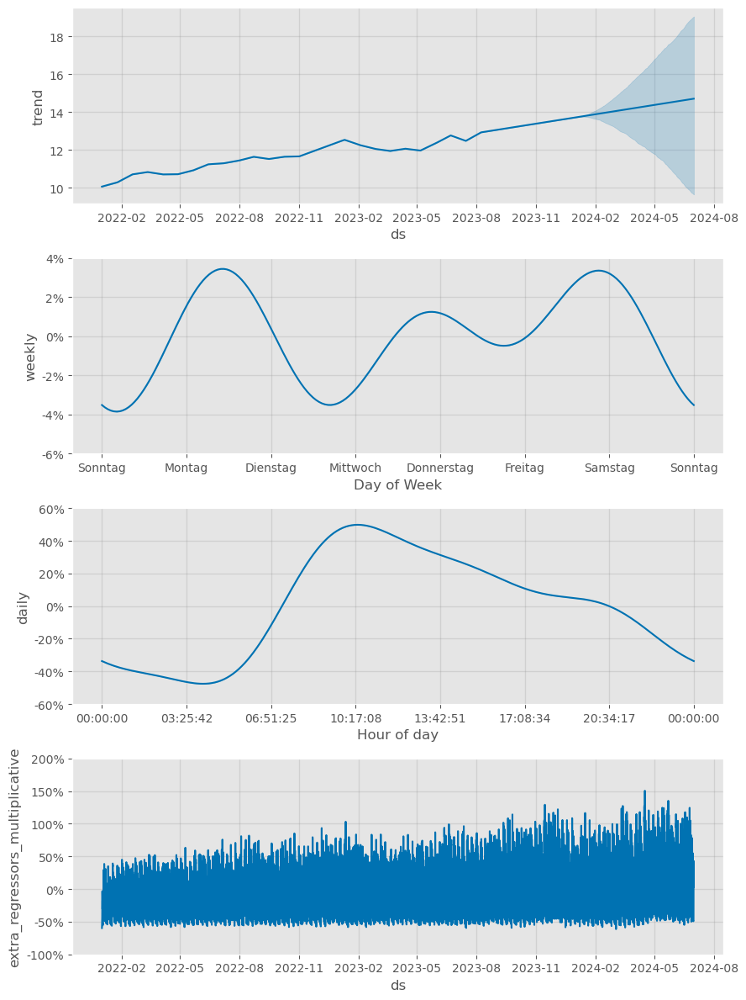

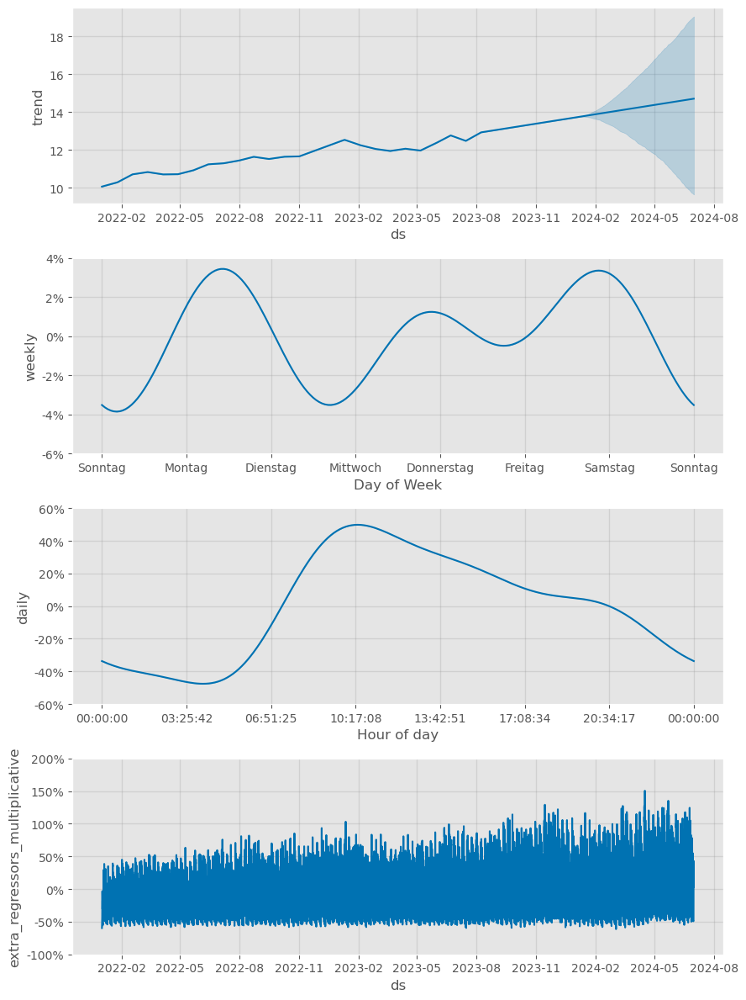

In [853]:
prophet_model.plot_components(forecast)


### Vergleich Vorhersage und Tesdaten

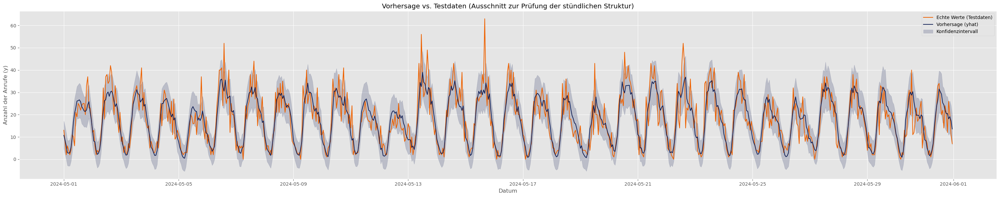

In [856]:
import matplotlib.pyplot as plt

# Zeitbereich für den Ausschnitt
start = "2024-05-01"
end = "2024-05-31 23:00:00"

# Vorhersage-Ausschnitt
forecast_subset = forecast[(forecast['ds'] >= start) & (forecast['ds'] <= end)]

# Testdaten-Ausschnitt
test_subset = df_prophet_test[(df_prophet_test['ds'] >= start) & (df_prophet_test['ds'] <= end)]

# Plot
plt.figure(figsize=(30, 6))

# Tatsächliche Testdaten
plt.plot(test_subset['ds'], test_subset['y'], label='Echte Werte (Testdaten)', color='#EE6100')

# Vorhersage
plt.plot(forecast_subset['ds'], forecast_subset['yhat'], label='Vorhersage (yhat)', color='#132157')
plt.fill_between(forecast_subset['ds'], forecast_subset['yhat_lower'], forecast_subset['yhat_upper'],
                 color='#132157', alpha=0.2, label='Konfidenzintervall')

# Styling
plt.title('Vorhersage vs. Testdaten (Ausschnitt zur Prüfung der stündlichen Struktur)')
plt.xlabel('Datum')
plt.ylabel('Anzahl der Anrufe (y)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


### Permutation importance Analyse
Diese Methode besteht darin, die Werte eines bestimmten Features zufällig zu permutieren und zu sehen, wie stark die Modellleistung (z. B. durch MSE oder MAE) beeinträchtigt wird. Ein starker Anstieg des Fehlers zeigt, dass das Feature wichtig ist. Analyse dient dazu, herauszufinden, wie wichtig die einzelnen Regressoren (Features) für die Vorhersage sind. 

In [855]:
from sklearn.metrics import mean_squared_error
import numpy as np
import pandas as pd

# Funktion: Permutation Importance für einen Regressor
def permutation_importance_prophet(model, df_future, regressor_name, y_true_df, n_repeats=5):
    # Basisvorhersage
    baseline_forecast = model.predict(df_future)
    
    # Zusammenführen mit echten Werten per Datum
    merged = pd.merge(
        baseline_forecast[['ds', 'yhat']],
        y_true_df[['ds', 'y']],
        on='ds',
        how='inner'
    )
    
    baseline_mse = mean_squared_error(merged['y'], merged['yhat'])

    importances = []
    for _ in range(n_repeats):
        df_future_permuted = df_future.copy()
        df_future_permuted[regressor_name] = np.random.permutation(df_future_permuted[regressor_name].values)

        forecast_permuted = model.predict(df_future_permuted)

        # Wieder zusammenführen
        merged_perm = pd.merge(
            forecast_permuted[['ds', 'yhat']],
            y_true_df[['ds', 'y']],
            on='ds',
            how='inner'
        )
        
        perm_mse = mean_squared_error(merged_perm['y'], merged_perm['yhat'])
        importances.append(perm_mse - baseline_mse)
    
    return np.mean(importances), np.std(importances)


In [857]:
# Liste der Regressoren
regressors = ['weekday', 'hour',
              'year', 'lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_7', 'lag_23', 'lag_168']

# Dictionary für die Ergebnisse
importance_results = {}

for reg in regressors:
    print(f"Berechne Importance für: {reg}")
    mean_diff, std_diff = permutation_importance_prophet(
        model=prophet_model,
        df_future=future.copy(),         # das Set, auf dem die Vorhersage gemacht wird
        regressor_name=reg,
        y_true_df=df_prophet_test[['ds', 'y']],  # tatsächliche Werte mit Datum
        n_repeats=5
    )
    importance_results[reg] = (mean_diff, std_diff)

# Ergebnisse sortiert ausgeben
for reg, (mean_diff, std_diff) in sorted(importance_results.items(), key=lambda x: -x[1][0]):
    print(f"{reg}: ΔMSE = {mean_diff:.4f} ± {std_diff:.4f}")


Berechne Importance für: weekday
Berechne Importance für: hour
Berechne Importance für: year
Berechne Importance für: lag_1
Berechne Importance für: lag_2
Berechne Importance für: lag_3
Berechne Importance für: lag_4
Berechne Importance für: lag_7
Berechne Importance für: lag_23
Berechne Importance für: lag_168
lag_1: ΔMSE = 8.9980 ± 0.3535
lag_2: ΔMSE = 1.6036 ± 0.2010
weekday: ΔMSE = 1.3487 ± 0.1386
lag_168: ΔMSE = 1.2324 ± 0.1135
lag_23: ΔMSE = 0.5165 ± 0.0779
lag_4: ΔMSE = 0.3692 ± 0.1210
lag_3: ΔMSE = 0.3257 ± 0.0509
hour: ΔMSE = 0.2314 ± 0.0448
year: ΔMSE = 0.1192 ± 0.0291
lag_7: ΔMSE = 0.0445 ± 0.0428


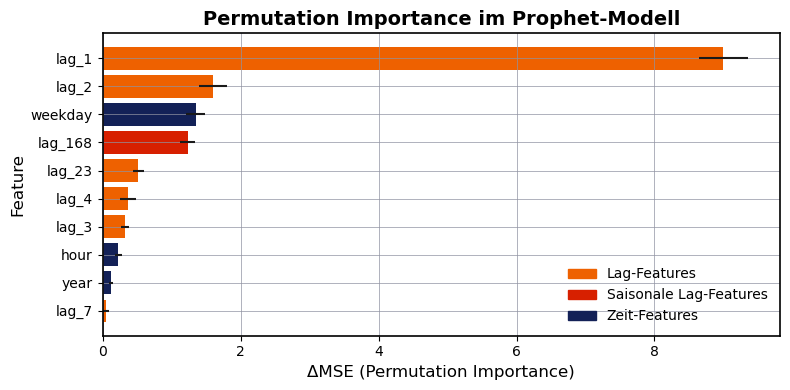

In [1099]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# Farben definieren
lag_color = '#EE6100FF'
lag_important_color = '#D72000FF'
time_color = '#132157FF'

# Sortieren
sorted_results = sorted(importance_results.items(), key=lambda x: -x[1][0])
labels = [k for k, _ in sorted_results]
means = [v[0] for _, v in sorted_results]
errors = [v[1] for _, v in sorted_results]

# Feature-Kategorien definieren
lag_features = (
    [f"lag_{i}" for i in range(1, 25)] +
    [f"lag_{i}" for i in range(25, 166, 5)]
)
lag_important = ["lag_24", "lag_168"]
time_features = ["days_to_holiday", "weekday", "hour", "day", "dayofyear", "is_weekend", "week", "weekofyear", "month", "year", "quarter_of_year"]

# Farben zuweisen
colors = [
    lag_important_color if feat in lag_important
    else lag_color if feat in lag_features
    else time_color
    for feat in labels
]

# Plot
plt.style.use('default')
fig, ax = plt.subplots(figsize=(8, 4))
bars = ax.barh(labels, means, xerr=errors, color=colors)

# Gitterlinien und Rahmen stylen
ax.grid(True, which='major', linestyle='-', linewidth=0.5, color='#9093A2FF')
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.2)
    spine.set_color('black')

# Titel und Achsenbeschriftungen
ax.set_title("Permutation Importance im Prophet-Modell", fontsize=14, weight='bold')
ax.set_xlabel("ΔMSE (Permutation Importance)", fontsize=12)
ax.set_ylabel("Feature", fontsize=12)
ax.invert_yaxis()

# Legende
legend_handles = [
    Patch(color=lag_color, label='Lag-Features'),
    Patch(color=lag_important_color, label='Saisonale Lag-Features'),
    Patch(color=time_color, label='Zeit-Features')
]
ax.legend(handles=legend_handles, loc='lower right', frameon=False)

plt.tight_layout()
plt.show()



Prophet-Diagnosewerte
Ljung-Box (Q):           17.74
Prob(Q):                 0.0596
Jarque-Bera (JB):        1060.21
Prob(JB):                0.0000
Heteroskedasticity (H):  7.71
Prob(H):                 0.0055
Skew:                    0.42
Kurtosis:                5.26



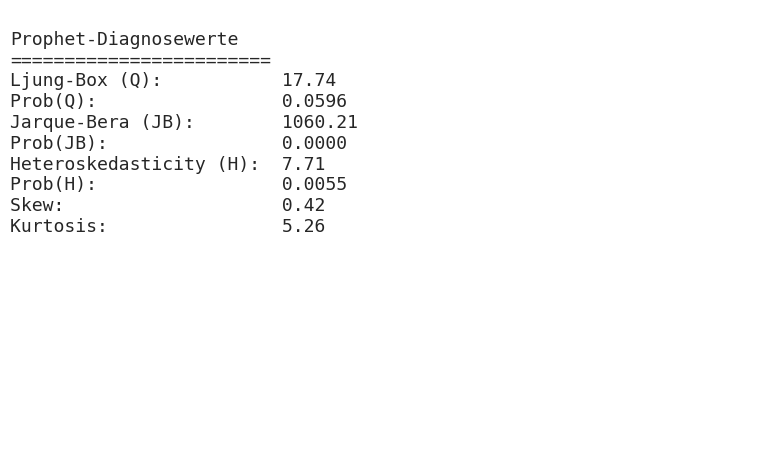

In [1073]:
from scipy import stats
from statsmodels.stats.diagnostic import acorr_ljungbox, het_breuschpagan
from statsmodels.stats.stattools import jarque_bera
from statsmodels.tools.tools import add_constant

# Residuen
residuals = y_test - prophet_y_pred
standardized_residuals = (residuals - np.mean(residuals)) / np.std(residuals)

# Ljung-Box Test
ljung_box = acorr_ljungbox(residuals, lags=[10], return_df=True)

# Jarque-Bera Test
jb_stat, jb_pvalue, skew, kurtosis = jarque_bera(residuals)

# Feature X für Breusch-Pagan
X = pd.DataFrame({'t': range(len(prophet_y_pred))})
X = add_constant(X)
bp_test = het_breuschpagan(residuals, X)
bp_stat, bp_pvalue = bp_test[0], bp_test[1]

# Inhalt vorbereiten
text = f"""
Prophet-Diagnosewerte
========================
Ljung-Box (Q):           {ljung_box['lb_stat'].iloc[0]:.2f}
Prob(Q):                 {ljung_box['lb_pvalue'].iloc[0]:.4f}
Jarque-Bera (JB):        {jb_stat:.2f}
Prob(JB):                {jb_pvalue:.4f}
Heteroskedasticity (H):  {bp_stat:.2f}
Prob(H):                 {bp_pvalue:.4f}
Skew:                    {skew:.2f}
Kurtosis:                {kurtosis:.2f}
"""

print(text)

# Grafik
fig, ax = plt.subplots(figsize=(8, 5))
ax.axis("off")
ax.text(0, 1, text, fontsize=13, fontfamily="monospace", va="top")
plt.tight_layout()
plt.savefig("prophet_diagnostics_clean.png", dpi=300)
plt.show()


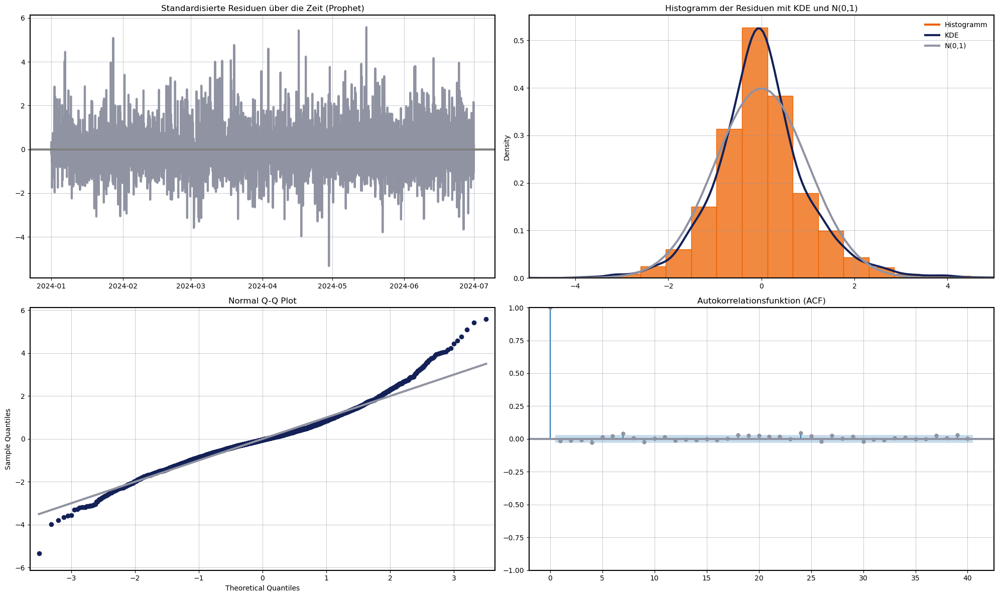

In [1046]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf
from scipy import stats

# Vorhersage erstellen
forecast = prophet_model.predict(future)

# 🧠 Index der Prophet-Vorhersage sichern
prophet_forecast_index = forecast['ds']

# Prophet-Vorhersage explizit als Series mit korrekt gesetztem Index
prophet_y_pred = pd.Series(forecast['yhat'].values, index=prophet_forecast_index, name='yhat')

# Sicherstellen, dass Testdaten denselben Zeitraum abdecken
y_test = df_prophet_test.set_index('ds')

# Gemeinsamen Zeitraum bestimmen
common_index = y_test.index.intersection(prophet_y_pred.index)

# Auf gleichen Zeitraum kürzen
prophet_y_pred = prophet_y_pred.loc[common_index]
y_test = y_test.loc[common_index, 'y']

# Residuen berechnen
residuals = y_test - prophet_y_pred

# Standardisierte Residuen berechnen
standardized_residuals = (residuals - np.mean(residuals)) / np.std(residuals)

# 2x2 Plot-Layout erstellen
fig, axes = plt.subplots(2, 2, figsize=(20, 12))
axes = axes.flatten()

# Farben definieren
line_color = '#9093A2FF'
gray = '#9093A2FF'
kde_color = '#9093A2FF'
point_color = '#132157FF'
blue = '#132157FF'
hist_color = '#EE6100FF'
orange = '#EE6100FF'
norm_color = '#9093A2FF'
background_color = '#ffffff'
grid_color = '#9093A2FF'
spine_color = 'black'
line_width = 3

# 1. Standardisierte Residuen über die Zeit
axes[0].plot(standardized_residuals, color=line_color, linewidth=line_width)
axes[0].axhline(0, linestyle='-', color='gray')
axes[0].set_title('Standardisierte Residuen über die Zeit (Prophet)')
axes[0].set_facecolor(background_color)
axes[0].grid(color=grid_color, linestyle='-', linewidth=0.5, alpha=0.7)

# 2. Histogramm der Residuen mit KDE und Normalverteilung
sns.histplot(standardized_residuals, bins=20, kde=False, stat="density", ax=axes[1],
             color=hist_color, edgecolor=hist_color)
sns.kdeplot(standardized_residuals, ax=axes[1], color=blue, linewidth=line_width)
xmin, xmax = axes[1].get_xlim()
x = np.linspace(xmin, xmax, 100)
p = stats.norm.pdf(x, 0, 1)
axes[1].plot(x, p, color=gray, linewidth=line_width)
axes[1].set_xlim(-5, 5)
axes[1].set_title('Histogramm der Residuen mit KDE und N(0,1)')
axes[1].set_facecolor(background_color)
axes[1].grid(color=gray, linestyle='-', linewidth=0.5, alpha=0.7)

# Legende hinzufügen
handles = [
    plt.Line2D([0], [0], color=hist_color, lw=line_width, label='Histogramm'),
    plt.Line2D([0], [0], color=blue, lw=line_width, label='KDE'),
    plt.Line2D([0], [0], color=gray, lw=line_width, label='N(0,1)')
]
axes[1].legend(handles=handles, loc='upper right', frameon=False)

# 3. Normal Q-Q Plot
sm.qqplot(standardized_residuals, line='s', ax=axes[2])
ax = axes[2]
# Linie (Diagonale)
ax.get_lines()[1].set_color(gray)
ax.get_lines()[1].set_linewidth(line_width)
# Punkte einfärben
ax.get_lines()[0].set_color(blue)
ax.get_lines()[0].set_markerfacecolor(blue)
ax.get_lines()[0].set_markeredgecolor(blue)
ax.set_title('Normal Q-Q Plot')
ax.set_facecolor(background_color)
ax.grid(color=grid_color, linestyle='-', linewidth=0.5, alpha=0.7)
ymin, ymax = ax.get_ylim()
max_abs = max(abs(ymin), abs(ymax))
ax.set_ylim(-max_abs, max_abs)


# 4. Autokorrelationsfunktion (ACF)
acf_plot = plot_acf(standardized_residuals, ax=axes[3], lags=40, color=blue)  # bars in blue

axes[3].set_title('Autokorrelationsfunktion (ACF)')
axes[3].set_facecolor(background_color)
axes[3].grid(color=grid_color, linestyle='-', linewidth=0.5, alpha=0.7)

# Konfidenzintervall-Farbe anpassen
for patch in axes[3].patches:
    patch.set_edgecolor(gray)
    patch.set_facecolor(blue)

for line in axes[3].lines:
    line.set_color(gray)
    line.set_linewidth(line_width)


# Rahmen (Spines) und Linienbreite anpassen
for ax in axes:
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1.5)
        spine.set_color(spine_color)
    for line in ax.get_lines():
        line.set_linewidth(line_width)

# Layout anpassen und anzeigen
plt.tight_layout()
plt.show()


In [980]:
min_len = min(len(y_test_prophet), len(prophet_y_pred))

y_test_prophet = y_test_prophet[:min_len]
y_pred_trimmed = prophet_y_pred[:min_len]


# Grundlegende Metriken
mae = mean_absolute_error(y_test_prophet, prophet_y_pred)
mse = mean_squared_error(y_test_prophet, prophet_y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_prophet, prophet_y_pred)

# Beide auf denselben Index bringen
y_test_aligned = y_test_prophet.reset_index(drop=True)
prophet_y_pred_aligned = prophet_y_pred.reset_index(drop=True)

# Filter: Kein y_true = 0
mask = y_test_aligned != 0
mape = np.mean(np.abs((y_test_aligned[mask] - prophet_y_pred_aligned[mask]) / y_test_aligned[mask])) * 100

# SMAPE
denominator = np.abs(y_test_aligned) + np.abs(prophet_y_pred_aligned)
mask_smape = denominator != 0
smape_val = 100 * np.mean(2 * np.abs(y_test_aligned[mask_smape] - prophet_y_pred_aligned[mask_smape]) / denominator[mask_smape])

# Median Absolute Error
residuals = y_test_aligned - prophet_y_pred_aligned
med_ae = np.median(np.abs(residuals))


# Ausgabe
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")
print(f"MAPE: {mape:.2f}%")
print(f"SMAPE: {smape_val:.2f}%")
print(f"Median AE: {med_ae:.4f}")

MAE: 4.3717
MSE: 35.9103
RMSE: 5.9925
R²: 0.7114
MAPE: 43.18%
SMAPE: 39.40%
Median AE: 3.1816


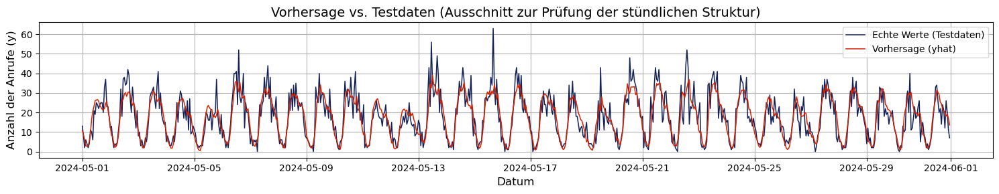

Plot gespeichert als 'prophet_forecast_vs_test.png'


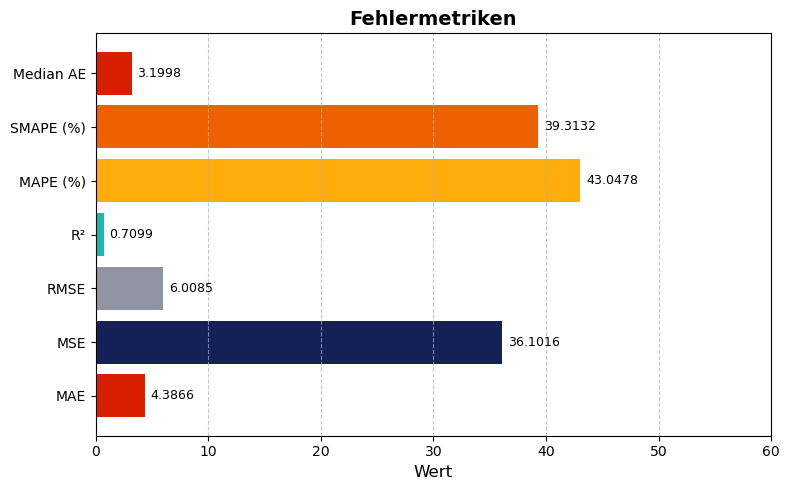

Fehlermetriken gespeichert als 'prophet_fehler.png'.


In [1104]:
# Kürze die Zeitstempel auf die Länge der Vorhersage
timestamps = df_hourly_test.index[:len(prophet_y_pred)]

# Erstelle das Forecast-Seriesobjekt mit Zeitstempel im Index
prophet_y_pred = pd.Series(prophet_y_pred.squeeze(), index=timestamps, name="calls")
# Testdaten ebenfalls kürzen und vorbereiten
test_df = df_hourly_test[["calls"]].iloc[:len(prophet_y_pred)]

# Funktionsaufruf
plot_forecast_vs_actual(
    forecast=prophet_y_pred,
    test_data=test_df,
    start_date="2024-05-01",
    end_date="2024-05-31 23:00:00",
    color=colors[3],
    filename="prophet_forecast_vs_test.png"
)
plot_error_metrics(df_hourly_test['calls'], prophet_y_pred, filename="prophet_fehler.png")

# Vorhersage Vergleich

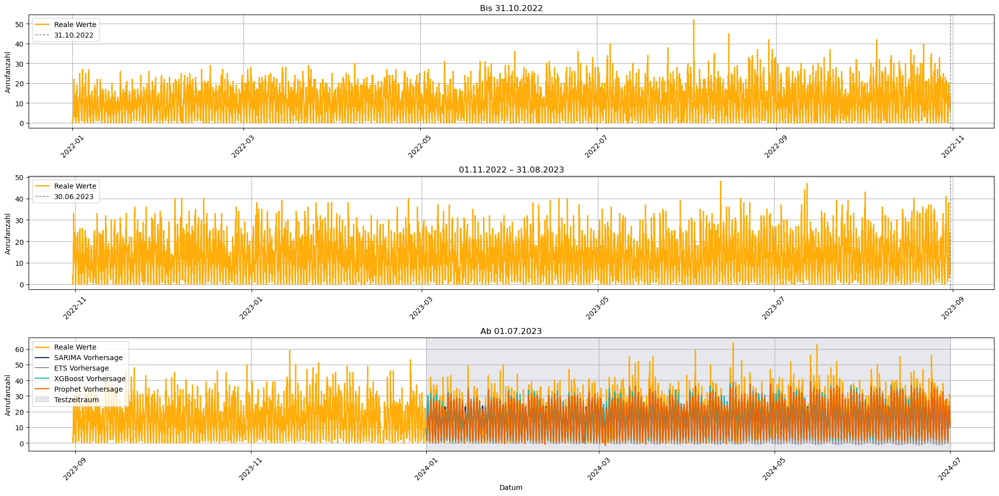

In [1019]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# Farben
colors = ['#D72000FF', '#EE6100FF', '#FFAD0AFF', '#1BB6AFFF', 
          '#9093A2FF', '#132157FF']
# Alle Daten kombinieren
df_all = pd.concat([df_hourly_time_modified, df_hourly_test])
df_all = df_all.sort_index()

# Zeiträume definieren
split_1 = pd.to_datetime("2022-10-31")
split_2 = pd.to_datetime("2023-08-31")
test_start = df_hourly_test.index[0]

# Drei Zeitabschnitte
df_1 = df_all[df_all.index <= split_1]
df_2 = df_all[(df_all.index > split_1) & (df_all.index <= split_2)]
df_3 = df_all[df_all.index > split_2]

# Subplots erstellen
fig, axes = plt.subplots(3, 1, figsize=(20, 10), sharex=False)

# --- Plot 1 ---
axes[0].plot(df_1.index, df_1['calls'], label="Reale Werte", color=colors[2], linewidth=1.8)
axes[0].axvline(split_1, color="gray", linestyle="--", linewidth=1, label="31.10.2022")
axes[0].set_title("Bis 31.10.2022")
axes[0].legend()
axes[0].grid(True)

# --- Plot 2 ---
axes[1].plot(df_2.index, df_2['calls'], label="Reale Werte", color=colors[2], linewidth=1.8)
axes[1].axvline(split_2, color="gray", linestyle="--", linewidth=1, label="30.06.2023")
axes[1].set_title("01.11.2022 – 31.08.2023")
axes[1].legend()
axes[1].grid(True)

# --- Plot 3 ---
axes[2].plot(df_3.index, df_3['calls'], label="Reale Werte", color=colors[2], linewidth=1.8)
# Vorhersagen einfügen:
# Bei jeder Vorhersage filtern wir den Index der jeweiligen Vorhersage und plotten sie nur für den relevanten Zeitraum
# SARIMA
axes[2].plot(sarimax_y_pred.index, sarimax_y_pred, label="SARIMA Vorhersage", color=colors[5], linestyle='-')
# ETS
axes[2].plot(ets_y_pred.index, ets_y_pred, label="ETS Vorhersage", color=colors[4], linestyle='-')
# XGBoost
axes[2].plot(xgb_y_pred.index, xgb_y_pred, label="XGBoost Vorhersage", color=colors[3], linestyle='-')
# Prophet
axes[2].plot(prophet_y_pred.index, prophet_y_pred, label="Prophet Vorhersage", color=colors[1], linestyle='-')

# Testzeitraum hervorheben
axes[2].axvspan(test_start, df_3.index[-1], color=cmap.colors[5], alpha=0.1, label="Testzeitraum")
axes[2].set_title("Ab 01.07.2023")
axes[2].legend()
axes[2].grid(True)
# Formatierung
for ax in axes:
    ax.set_ylabel("Anrufanzahl")
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.tick_params(axis='x', rotation=45)

axes[2].set_xlabel("Datum")

plt.tight_layout()
plt.show()



In [1026]:
xgb_y_pred

date
2024-01-01 00:00:00     8.329350
2024-01-01 01:00:00     5.202171
2024-01-01 02:00:00     3.345481
2024-01-01 03:00:00     2.059513
2024-01-01 04:00:00     1.919311
                         ...    
2024-06-23 19:00:00    17.026825
2024-06-23 20:00:00    16.909140
2024-06-23 21:00:00    15.515444
2024-06-23 22:00:00    13.288041
2024-06-23 23:00:00    11.215731
Name: calls, Length: 4200, dtype: float32

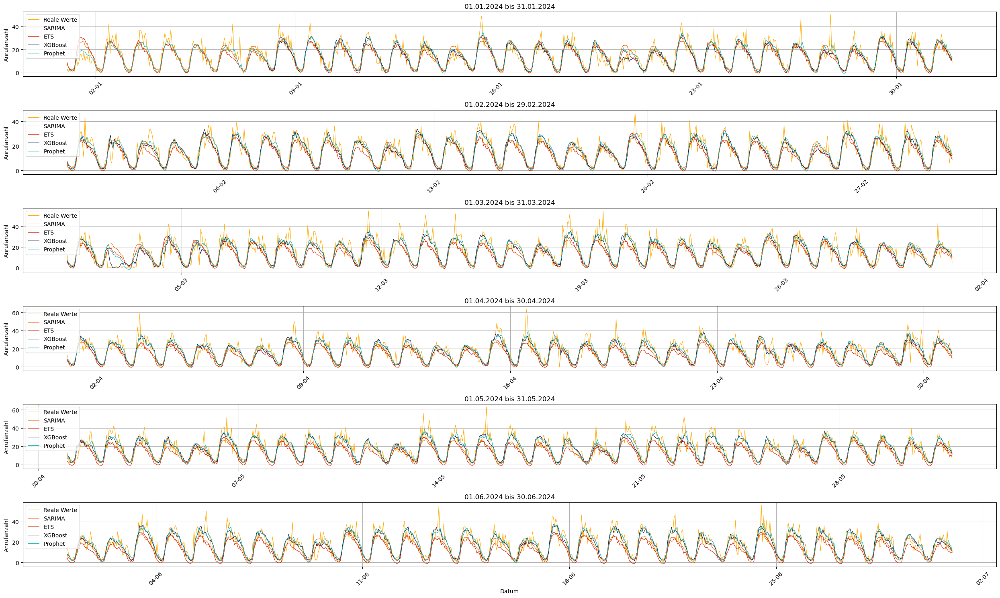

In [1124]:
# Farben festlegen
colors = ['#D72000FF', '#EE6100FF', '#FFAD0AFF', '#1BB6AFFF', 
          '#9093A2FF', '#132157FF']

# Beispiel-Daten für reale Werte und Vorhersagen
# Beispiel: df_all enthält die echten Daten bis zum 30.06.24
# Vorhersagen sollten für die verschiedenen Modelle erstellt werden

# Beispiel-Daten (Anpassung auf stündliche Daten)
date_range = pd.date_range(start="2024-01-01", end="2024-06-30", freq="H")

# Zeiträume definieren
months = pd.date_range("2024-01-01", "2024-06-30", freq="MS")

# Subsets erstellen
df_months = {month: df_all[(df_all.index >= month) & (df_all.index < month + pd.DateOffset(months=1))] for month in months}

# Subplots erstellen
fig, axes = plt.subplots(6, 1, figsize=(25, 15), sharex=False)

for i, (month, df_month) in enumerate(df_months.items()):
    # Plot der realen Werte
    axes[i].plot(df_month.index, df_month['calls'], label="Reale Werte", color=colors[2], linewidth=0.8)

    # Plot für SARIMA, wenn Index übereinstimmt
    if not sarimax_y_pred[df_month.index].empty:
        axes[i].plot(df_month.index, sarimax_y_pred[df_month.index], label="SARIMA", color=colors[1], linestyle='-', linewidth=0.8)
    
    # Plot für ETS, wenn Index übereinstimmt
    if not ets_y_pred[df_month.index].empty:
        axes[i].plot(df_month.index, ets_y_pred[df_month.index], label="ETS", color=colors[0], linestyle='-', linewidth=0.8)
    
    # Plot für XGBoost, wenn Index übereinstimmt
    common_index = df_month.index.intersection(xgb_y_pred.index)
    if not common_index.empty:
        axes[i].plot(common_index, xgb_y_pred[common_index], label="XGBoost", color=colors[5], linestyle='-', linewidth=0.8)

    # Plot für Prophet, wenn Index übereinstimmt
    if not prophet_y_pred[df_month.index].empty:
        axes[i].plot(df_month.index, prophet_y_pred[df_month.index], label="Prophet", color=colors[3], linestyle='-', linewidth=0.8)

    # Setze Titel und Gitter
    axes[i].set_title(f"{month.strftime('%d.%m.%Y')} bis {(month + pd.DateOffset(months=1) - pd.Timedelta(hours=1)).strftime('%d.%m.%Y')}")
    axes[i].legend()
    axes[i].grid(True)

# Formatierung
for ax in axes:
    ax.set_ylabel("Anrufanzahl")
    ax.xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m'))
    ax.tick_params(axis='x', rotation=45)

axes[5].set_xlabel("Datum")

plt.tight_layout()
plt.show()

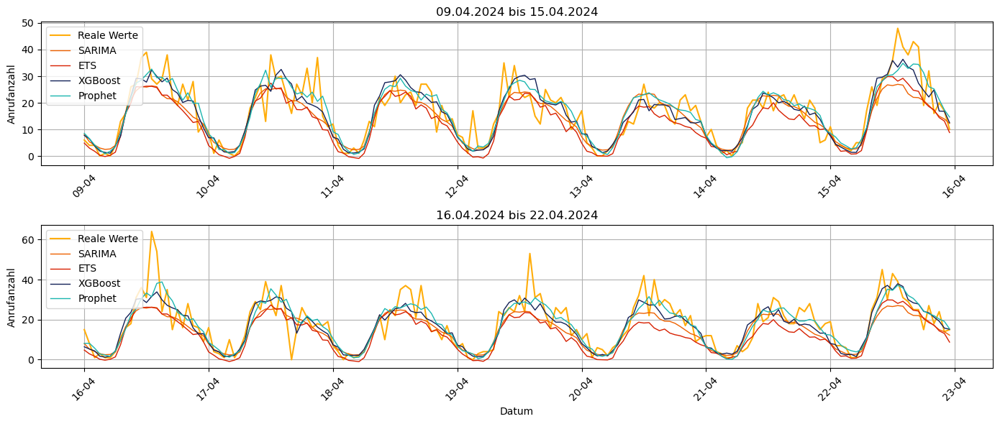

In [ ]:
import matplotlib.dates as mdates
import matplotlib.pyplot as plt

# Farben definieren
colors = ['#D72000FF', '#EE6100FF', '#FFAD0AFF', '#1BB6AFFF', 
          '#9093A2FF', '#132157FF']

# 🗓 Zeiträume definieren
week_ranges = [
    ("2024-04-09", "2024-04-16"),
    ("2024-04-16", "2024-04-23"),
]

# 📆 Wochendaten extrahieren
df_weeks = {
    pd.to_datetime(start): df_all[(df_all.index >= start) & (df_all.index < end)]
    for start, end in week_ranges
}

# 📊 Subplots erstellen
fig, axes = plt.subplots(2, 1, figsize=(14, 6), sharex=False)

for i, (start_date, df_week) in enumerate(df_weeks.items()):
    # Realwerte
    axes[i].plot(df_week.index, df_week['calls'], label="Reale Werte", color=colors[2], linewidth=1.5)

    # SARIMA
    if not sarimax_y_pred[df_week.index].empty:
        axes[i].plot(df_week.index, sarimax_y_pred[df_week.index], label="SARIMA", color=colors[1], linestyle='-', linewidth=1)

    # ETS
    if not ets_y_pred[df_week.index].empty:
        axes[i].plot(df_week.index, ets_y_pred[df_week.index], label="ETS", color=colors[0], linestyle='-', linewidth=1)

    # XGBoost
    common_index = df_week.index.intersection(xgb_y_pred.index)
    if not common_index.empty:
        axes[i].plot(common_index, xgb_y_pred[common_index], label="XGBoost", color=colors[5], linestyle='-', linewidth=1)

    # Prophet
    if not prophet_y_pred[df_week.index].empty:
        axes[i].plot(df_week.index, prophet_y_pred[df_week.index], label="Prophet", color=colors[3], linestyle='-', linewidth=1)

    # Titel und Gitter
    end_date = start_date + pd.Timedelta(days=7) - pd.Timedelta(hours=1)
    axes[i].set_title(f"{start_date.strftime('%d.%m.%Y')} bis {end_date.strftime('%d.%m.%Y')}")
    axes[i].legend()
    axes[i].grid(True)

# Formatierung
for ax in axes:
    ax.set_ylabel("Anrufanzahl")
    ax.xaxis.set_major_locator(mdates.DayLocator(interval=1))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m'))
    ax.tick_params(axis='x', rotation=45)

axes[-1].set_xlabel("Datum")

plt.tight_layout()
plt.show()


In [1131]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
import pandas as pd

def evaluate_forecasts_with_alignment(y_true: pd.Series, model_preds: dict):
    """
    Berechnet MAE, RMSE, MAPE und R² für mehrere Modelle – robust gegenüber verschiedenen Startzeitpunkten.

    Parameters:
    - y_true (pd.Series): Reale Werte mit Zeitindex
    - model_preds (dict): Dict mit Modellnamen als Schlüssel und pd.Series (Vorhersagen) als Werte

    Returns:
    - pd.DataFrame: Übersichtstabelle mit Fehlermetriken
    """
    results = []

    for model_name, y_pred in model_preds.items():
        # Gemeinsamen Index berechnen
        common_index = y_true.index.intersection(y_pred.index)

        # Wenn keine Überschneidung vorhanden, überspringen
        if common_index.empty:
            continue

        # Werte auf gemeinsamen Zeitraum beschränken
        y_t = y_true.loc[common_index]
        y_p = y_pred.loc[common_index]

        # Vermeide Division durch 0 bei MAPE
        y_t_safe = y_t.replace(0, np.nan)

        # Metriken berechnen
        mae = mean_absolute_error(y_t, y_p)
        rmse = np.sqrt(mean_squared_error(y_t, y_p))
        mape = np.mean(np.abs((y_t - y_p) / y_t_safe)) * 100
        r2 = r2_score(y_t, y_p)

        results.append({
            "Modell": model_name,
            "Startzeit": y_p.index.min().strftime('%d.%m.%Y %H:%M'),
            "Endzeit": y_p.index.max().strftime('%d.%m.%Y %H:%M'),
            "Zeilen": len(common_index),
            "MAE": round(mae, 2),
            "RMSE": round(rmse, 2),
            "MAPE (%)": round(mape, 2),
            "R²": round(r2, 3)
        })

    return pd.DataFrame(results).set_index("Modell").sort_values(by="MAE")

def plot_forecast_metrics_for_latex(metrics_df: pd.DataFrame, save_path: str = None):
    """
    Erstellt eine LaTeX-taugliche Grafik der Fehlermetriken MAE, RMSE und MAPE für verschiedene Modelle.

    Parameters:
    - metrics_df (pd.DataFrame): Ergebnis-DataFrame aus evaluate_forecasts_with_alignment
    - save_path (str): Optionaler Pfad, um die Grafik als PNG/PDF für LaTeX zu speichern
    """
    # Nur gewünschte Metriken für den Plot
    plot_df = metrics_df[["MAE", "RMSE", "MAPE (%)"]].copy()
    plot_df = plot_df.reset_index().melt(id_vars="Modell", var_name="Metrik", value_name="Wert")

    # Stil für LaTeX: Schlicht, mit Serifenschrift
    sns.set_theme(style="whitegrid", font="serif", context="talk")

    plt.figure(figsize=(10, 6))
    barplot = sns.barplot(
        data=plot_df,
        x="Metrik",
        y="Wert",
        hue="Modell",
        palette="Set2"
    )

    plt.title("Vergleich der Fehlermetriken pro Modell", fontsize=16)
    plt.ylabel("Fehlerwert")
    plt.xlabel("Metrik")
    plt.legend(title="Modell", bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')  # z. B. 'metrics_plot.pdf'
    plt.show()


In [1132]:
model_predictions = {
    "SARIMAX": sarimax_y_pred,
    "ETS": ets_y_pred,
    "XGBoost": xgb_y_pred,
    "Prophet": prophet_y_pred
}

metrics_table = evaluate_forecasts_with_alignment(y_test, model_predictions)
display(metrics_table)


,Startzeit,Endzeit,Zeilen,MAE,RMSE,MAPE (%),R²
Modell,,,,,,,
XGBoost,08.01.2024 00:00,30.06.2024 23:00,4200,4.20,5.79,37.50,0.732
Prophet,01.01.2024 00:00,30.06.2024 23:00,4368,4.39,6.01,43.05,0.710
SARIMAX,01.01.2024 00:00,30.06.2024 23:00,4368,4.80,6.78,42.93,0.630
ETS,01.01.2024 00:00,30.06.2024 23:00,4368,5.38,7.38,44.34,0.562


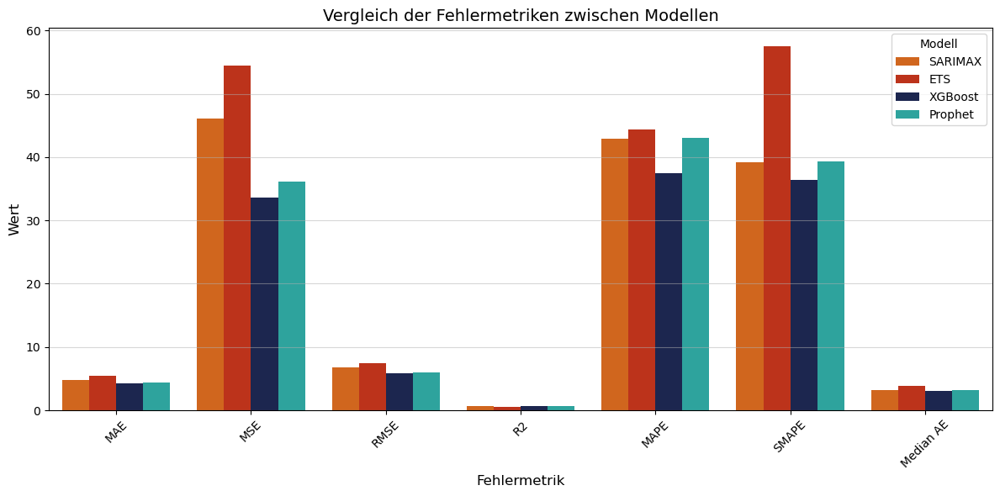

In [1134]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# Eigene Farbpalette definieren
custom_palette = {
    "SARIMAX": "#EE6100FF",    # Orange
    "ETS": "#D72000FF",       # Rot
    "XGBoost": "#132157FF",   # Dunkelblau
    "Prophet": "#1BB6AFFF"    # Türkis
}

# Daten vorbereiten
data = {
    "Modell": ["SARIMAX", "ETS", "XGBoost", "Prophet"],
    "MAE": [4.8004, 5.3826, 4.1984, 4.3866],
    "MSE": [46.0313, 54.4805, 33.5719, 36.1016],
    "RMSE": [6.7846, 7.3811, 5.7941, 6.0085],
    "R2": [0.6301, 0.5622, 0.7316, 0.7099],
    "MAPE": [42.93, 44.34, 37.5026, 43.05],
    "SMAPE": [39.19, 57.51, 36.4226, 39.31],
    "Median AE": [3.1737, 3.8982, 3.0288, 3.1998]
}

# DataFrame und Umformung
df_metrics = pd.DataFrame(data)
df_melted = df_metrics.melt(id_vars="Modell", var_name="Metrik", value_name="Wert")

# Plot erstellen
plt.figure(figsize=(12, 6))
sns.barplot(
    data=df_melted,
    x="Metrik",
    y="Wert",
    hue="Modell",
    palette=custom_palette
)

# Plot gestalten
plt.title("Vergleich der Fehlermetriken zwischen Modellen", fontsize=14)
plt.ylabel("Wert", fontsize=12)
plt.xlabel("Fehlermetrik", fontsize=12)
plt.xticks(rotation=45)
plt.legend(title="Modell")
plt.tight_layout()
plt.grid(axis='y', linestyle='-', alpha=0.5)

plt.show()


In [1135]:
def print_diagnostics(y_true, y_pred, model_name="Modell"):
    # Sicherstellen, dass beide Serien ausgerichtet sind
    residuals = y_true - y_pred
    residuals = residuals.dropna()

    # Standardisierte Residuen
    standardized_residuals = (residuals - np.mean(residuals)) / np.std(residuals)

    # Ljung-Box
    ljung_box = acorr_ljungbox(residuals, lags=[10], return_df=True)
    lb_stat = ljung_box['lb_stat'].iloc[0]
    lb_pvalue = ljung_box['lb_pvalue'].iloc[0]

    # Jarque-Bera
    jb_stat, jb_pvalue, skew, kurtosis = jarque_bera(residuals)

    # Breusch-Pagan
    X = add_constant(pd.DataFrame(y_pred.loc[residuals.index]))  # Nur passende Werte
    bp_test = het_breuschpagan(residuals, X)
    bp_stat, bp_pvalue = bp_test[0], bp_test[1]

    # Textausgabe
    print(f"\nStatistische Diagnose für {model_name}")
    print("=" * (30 + len(model_name)))
    print(f"Ljung-Box (Q):           {lb_stat:.2f}")
    print(f"Prob(Q):                 {lb_pvalue:.4f}")
    print(f"Jarque-Bera (JB):        {jb_stat:.2f}")
    print(f"Prob(JB):                {jb_pvalue:.4f}")
    print(f"Heteroskedasticity (H):  {bp_stat:.2f}")
    print(f"Prob(H):                 {bp_pvalue:.4f}")
    print(f"Skew:                    {skew:.2f}")
    print(f"Kurtosis:                {kurtosis:.2f}")

# Anwendung für alle Modelle
for model_name, y_pred in model_predictions.items():
    aligned_y_test = y_test.loc[y_pred.index]  # Zeitlich ausrichten
    print_diagnostics(aligned_y_test, y_pred, model_name=model_name)


Statistische Diagnose für SARIMAX
Ljung-Box (Q):           1197.29
Prob(Q):                 0.0000
Jarque-Bera (JB):        1360.19
Prob(JB):                0.0000
Heteroskedasticity (H):  374.97
Prob(H):                 0.0000
Skew:                    0.69
Kurtosis:                5.35

Statistische Diagnose für ETS
Ljung-Box (Q):           1002.04
Prob(Q):                 0.0000
Jarque-Bera (JB):        1192.10
Prob(JB):                0.0000
Heteroskedasticity (H):  267.01
Prob(H):                 0.0000
Skew:                    0.53
Kurtosis:                5.33

Statistische Diagnose für XGBoost
Ljung-Box (Q):           17.69
Prob(Q):                 0.0605
Jarque-Bera (JB):        1121.38
Prob(JB):                0.0000
Heteroskedasticity (H):  340.53
Prob(H):                 0.0000
Skew:                    0.54
Kurtosis:                5.29

Statistische Diagnose für Prophet
Ljung-Box (Q):           17.74
Prob(Q):                 0.0596
Jarque-Bera (JB):        1060.21
Prob(JB)